# Skin Cancer Detection and Classification with Deep Learning

#### CAPSTONE PROJECT for Applied Data Science and Machine Learning Course   
#### Pawel Rosikiewicz   
#### prosikiewicz@gmail.com

In [1]:
# *********************************************************** #
#                                                             #
#    Copyrights:                                              # ivbju
#                                                             #
#    IT IS NOT ALLOWED TO COPY, DISTRIBUTE                    # 
#    in any form of these files, scripts, methods,            # 
#    data and results without written persmission             #
#    of the Author                                            #
#                                                             #
#    Author: Pawel Rosikiewicz                                #
#    Contact: prosikiewicz_gmail.com                          #
#                                                             #
# *********************************************************** #

# standard imports

In [2]:
import os # allow changing, and navigating files and folders, 
import shutil
import sys
import re # module to use regular expressions, 
import glob # lists names in folders that match Unix shell patterns
import random # functions that use and generate random numbers

import pickle
import warnings
import numpy as np # support for multi-dimensional arrays and matrices
import pandas as pd # library for data manipulation and analysis
import seaborn as sns # advance plots, for statistics, 
import matplotlib as mpl # to get some basif functions, heping with plot mnaking 
import matplotlib.pyplot as plt # for making plots, 

from PIL import Image, ImageDraw
from IPython.display import display
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import scale
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf # tf.__version__ 
import tensorflow.keras as keras 
import matplotlib.pyplot as plt # for making plots, 
import scipy.stats as stats  # library for statistics and technical programming, 
import scipy.cluster.hierarchy as sch
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from IPython.display import display
from tensorflow.keras import backend as K # used for housekeeping of tf models,
from sklearn.metrics import accuracy_score
from sklearn.utils import class_weight
# To avoid restaring the kernel with keras, preffered solution; use conda install nomkl
os.environ['KMP_DUPLICATE_LIB_OK']='True'

# setup basedir & load project/task imports

In [3]:
# setup basedir
basedir = os.path.dirname(os.getcwd())
os.chdir(basedir)
sys.path.append(basedir)

# caution, loaded only form basedir,
import src.utils.EDA_Helpers2 as eda_helpers 
from src.utils.example_plots import *
from src.utils.feature_extraction_tools import encode_images_with_tfhubmodule # with tf.compat.v1 functions, for tf.__version___ >= 1.15
from src.utils.clustered_histogram import find_n_examples_in_each_class, clustered_histogram_with_image_examples, calculate_linkage_for_images_with_extracted_features
from src.utils.clustered_histogram import add_descriptive_notes_to_each_cluster_in_batch_labels, find_clusters_on_dendrogram, create_clustered_heatmap_with_img_examples
from src.utils.data_loaders import load_encoded_imgbatch_using_logfile, load_raw_img_batch
from src.utils.example_plots_after_clustering import plot_img_examples, create_spaces_between_img_clusters, plot_img_examples_from_dendrogram
from src.utils.feature_extraction_tools import encode_images
from src.utils.data_loaders import load_encoded_imgbatch_using_logfile, load_raw_img_batch
from src.utils.example_plots_after_clustering import plot_img_examples, create_spaces_between_img_clusters, plot_img_examples_from_dendrogram
from src.utils.annotated_pie_charts import annotated_pie_chart_with_class_and_group, prepare_img_classname_and_groupname
from src.utils.tools_for_plots import create_class_colors_dict
from src.utils.logreg_tools import my_logredCV, plot_examples_with_predictions_and_proba, plot_examples_with_predictions_and_proba_gamma
from src.utils.random_forest import random_forest_grid_search, plot_random_tree_summary_andor_table
from src.utils.SVM_tools import SVM_grid_search, plot_grid_acc_and_return_summary_df
from src.utils.tools_for_plots import create_class_colors_dict
from src.utils.model_summary_plots import plot_grid_acc_and_return_summary_df, visual_model_summary, model_gridsearch_summary_plots
from src.utils.knn_tools import knn_grid_search
from src.utils.image_augmentation import *
from src.utils.annotated_pie_charts import annotated_pie_chart_with_class_and_group, prepare_img_classname_and_groupname
from src.utils.tools_for_plots import create_class_colors_dict
from src.utils.pca_tools import pca_analyis_with_plots, pca_scree_plots, pca_pve_vs_variance_scatterplots
from src.utils.new_data_loaders import find_different_filetypes
from src.utils.sklearn_models_tools import sklearn_grid_search
from src.utils.method_comparison_tools import boxplot_with_acc_from_different_models
from src.utils.method_comparison_tools import method_comparison_boxplot
from src.utils.cnn_transfer_learning_tools import CNN_GridSearch, create_keras_two_layer_dense_model, plot_NN_loss_acc
from src.utils.method_comparison_tools import new_method_comparison_boxplot
warnings.filterwarnings("ignore")

# configs

In [4]:
# load project configs
from src.configs.project_configs import PROJECT_NAME
from src.configs.project_configs import CLASS_DESCRIPTION # information on each class, including descriptive class name and diegnostic description - used to help wiht the project
from src.configs.tfhub_configs import TFHUB_MODELS # names of TF hub modules that I presenlected for featuress extraction with all relevant info,
from src.configs.dataset_configs import DATASET_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import CLASS_LABELS_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import DROPOUT_VALUE # str, special value to indicate samples to remoce in class labels
from src.configs.config_functions import CONFIG_FUNCTION_define_datasets # function that creates datasunbsets collections for one dataset (custome made for that project)

# set task configs, ........................................................................  
TASK_NAME                  = "SUMMARY_models_comparison"
DATASET_NAME               = "HAM10000" # dataset name, 
DATASET_VARIANTS           = DATASET_CONFIGS[DATASET_NAME]["labels"] # labels that will be added here
MODULE_NAMES               = [TFHUB_MODELS[x]['module_name'] for x in list(TFHUB_MODELS.keys())]

# set run configs, ........................................................................   
METHOD_NAME_LIST           = ["knn", "random_forest", "svm", "cnn_transfer_learning", "deNovoCNN",
                              "knn_balanced", "random_forest_balanced", "cnn_transfer_learning_balanced"]
DATASET_LIST               = ["HAM10000", "HAM10000", "HAM10000", "HAM10000", "HAM10000",
                              "HAM10000_balanced", "HAM10000_balanced", "HAM10000_balanced"]
METHOD_GROUPS              = ["sklearn_model", "sklearn_model", "sklearn_model", "transfer_learning", "denovo_cnn",
                             "sklearn_model", "sklearn_model", "transfer_learning"]
BATCH_COLLECTION_NAMES     = {"HAM10000": { "boxpot":["parameter_selection", 'cnn_all_data'],
                                            "scatter":["best_models_with_all_data", "full_models"]
                              }}

# create path to store results, ............................................................
PATH_raw = os.path.join(basedir, "data/raw", DATASET_NAME)
PATH_interim = os.path.join(basedir, "data/interim")
PATH_models = os.path.join(basedir, "models")
PATH_interim_dataset_summary_tables = os.path.join(PATH_interim, "dataset_summary_tables")
PATH_extracted_features = os.path.join(PATH_interim, f"{DATASET_NAME}_extracted_features")
PATH_additional_class_labels = os.path.join(PATH_extracted_features, "additional_class_labels")
PATH_data_results = os.path.join(basedir, "data/results")
PATH_results = os.path.join(PATH_data_results, f"{DATASET_NAME}_{TASK_NAME}")

# build summary table with results from all methods, varinats and models,
---

In [5]:
######### PART 1A ........ LOAD ALL DATA 

os.chdir(PATH_data_results)
counter = -1
for i, (one_method_name, dataset_name, method_group_name) in enumerate(zip(METHOD_NAME_LIST, DATASET_LIST, METHOD_GROUPS)):
    
    # go to directory, 
    methods_results_path = os.path.join(PATH_data_results,f"{dataset_name}_{one_method_name}")
    os.chdir(methods_results_path)

    # catalog all files inside 
    file_list = []
    for file in glob.glob("*__summary_table.csv"):
        file_list.append(file)
    
    # info
    print("\n", i, one_method_name, ": ",len(file_list), " files witll be added...\n")
        
    # load and concatenate all of them
    for file_name in file_list:
        counter+=1
        
        # .. load summary_df, and add filename and path
        one_module_summary_df = pd.read_csv(file_name)
        one_module_summary_df["summary_table__file_name"] = file_name
        one_module_summary_df["summary_table__path"] = methods_results_path
         
        # .. add better organized names used while loading file
        one_module_summary_df["new_method_name"] = one_method_name
        one_module_summary_df["new_dataset_name"] = dataset_name 
        one_module_summary_df["new_method_group"] = method_group_name                                                                
        
        # ... concatenate
        if counter==0:
            summary_df = one_module_summary_df 
        else:
            summary_df = pd.concat([summary_df,one_module_summary_df], axis=0)    
        
        # ... info
        # print(f"- {counter} - {file_name} - {summary_df.shape}")    
summary_df.reset_index(drop=True, inplace=True)
print(summary_df.shape)


######### PART 1B ........ CUSTOM CLEANING
problematic_columns = ['validation_split'] # with no usefull data, typically infherrited from params, 
for pc in problematic_columns:
    try:
        summary_df = summary_df.drop('validation_split', axis=1)
    except:
        print(pc, " - not found")
summary_df.shape


# in one of my fucntions, baseline was a smallest proportion, 
# it is being corrected here (I checked it by hand in excel using batch labels)
baseline_missing = summary_df.summary_table__file_name.str.contains("deNovoCNN")
one_different_dataset_variant = summary_df.summary_table__file_name.str.contains("Cancer_Classification")

# .. now replace
summary_df.baseline_acc_valid.loc[baseline_missing] = 0.372  # its balanced,
summary_df.baseline_acc_test.loc[baseline_missing] = 0.628  # these are same as inbalanced datasets, 
summary_df.baseline_acc_test_2.loc[baseline_missing] = 0.617
# ....
summary_df.baseline_acc_valid.loc[baseline_missing & one_different_dataset_variant] = 0.336
summary_df.baseline_acc_test.loc[baseline_missing & one_different_dataset_variant] = 0.351
summary_df.baseline_acc_test_2.loc[baseline_missing & one_different_dataset_variant] = 0.348


# remove one corrupted file
print(summary_df.shape)
files_to_remove = summary_df.summary_table__file_name.str.contains("unit_test") # I accidentally left one file like that
summary_df = summary_df.loc[files_to_remove==False, :]
summary_df.reset_index(drop=True, inplace=True)



######### PART 1C ........ add informative method name

# add column with method_group, 
summary_df["method_name"] = [f"{x}, {y} ({z})" for (x,y, z) in zip(
                                 summary_df.loc[:,"method"].values.tolist(),
                                 summary_df.loc[:, "method_variant"].values.tolist(),
                                 summary_df.loc[:, "module"].values.tolist(),
                                 )]
summary_df["method_full_name"] = [f"{x}__{y}__{z}__{zz}" for (x,y,z,zz) in zip(
        summary_df.loc[:,"method"].values.tolist(),
        summary_df.loc[:, "method_variant"].values.tolist(),
        summary_df.loc[:, "module"].values.tolist(),
        summary_df.loc[:, "dataset_variant"].values.tolist()        
    )]
summary_df.reset_index(drop=True, inplace=True)
summary_df.shape


 0 knn :  60  files witll be added...


 1 random_forest :  60  files witll be added...


 2 svm :  31  files witll be added...


 3 cnn_transfer_learning :  24  files witll be added...


 4 deNovoCNN :  12  files witll be added...


 5 knn_balanced :  60  files witll be added...


 6 random_forest_balanced :  60  files witll be added...


 7 cnn_transfer_learning_balanced :  20  files witll be added...

(5027, 62)
(5027, 61)


(5026, 63)

# small summaries

In [21]:
print("nr of aproaches used: ",summary_df.groupby("summary_table__file_name").count().loc[:, "model_ID"].shape)

nr of aproaches used:  (326,)


In [24]:
print("nr of models per methopds category: ",summary_df.groupby( ["dataset_variant"]).count().loc[:, "model_ID"])

nr of models per methopds category:  dataset_variant
Cancer_Classification                  1008
Cancer_Detection_And_Classification    1005
Cancer_Risk_Groups                     1004
Melanoma_Detection                     1005
Skin_Cancer_Detection                  1004
Name: model_ID, dtype: int64


In [32]:
print("nr of models per methopds category: ",summary_df.groupby( ["dataset_variant", "new_method_name", "module"]).count().loc[:, "model_ID"])

nr of models per methopds category:  dataset_variant                      new_method_name                 module                    
Cancer_Classification                cnn_transfer_learning           BiT_M_Resnet101                5
                                                                     Inception_v3                   5
                                                                     MobileNet_v2                   5
                                                                     Resnet50                       5
                                     cnn_transfer_learning_balanced  BiT_M_Resnet101                4
                                                                     Inception_v3                   4
                                                                     MobileNet_v2                   4
                                                                     Resnet50                       4
                                     deNovoCNN     

# CALULATE SENSITIVITY FOR DETECTING MELANOMA OR POTENTIAL MELANOMA WITH EACH MODEL
---

In [6]:
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

STAT_RESULTS = []
for row_nr in range(summary_df.shape[0]):
    print(".", end="")
    
    # (a) get required info
    model_ID                 = summary_df.model_ID.iloc[row_nr]
    dataset_variant          = summary_df.dataset_variant.iloc[row_nr]
    summary_table__file_name = summary_df.summary_table__file_name.iloc[row_nr]
    summary_table__path      = summary_df.summary_table__path.iloc[row_nr]
    
    # (b) get model predicitons,
    
    # .. load model predictions for that model
    model_predictions__file_name = pd.Series(summary_table__file_name).str.replace("summary_table.csv", "model_predictions_dict.p").iloc[0]
    
    # .. Load predictions, 
    os.chdir(summary_table__path )
    with open(model_predictions__file_name, 'rb') as file: 
        model_predictions_dict  = pickle.load(file)  

    # .. get predicitons made only for that one model
    one_model_predictions_dict = model_predictions_dict[model_ID]
    
    
    # (c) get labels for a given dataset variant
    '''
        POSITIVE == Melanola, or class containing melanoma
        NEGATIVE == not melanoma, or class not containign melanoma
    '''
    melanoma_stat_labels_dict = CLASS_LABELS_CONFIGS[dataset_variant]['melanoma_stat_labels_dict']
    mel_dict_binary = {"NEGATIVE":0, "POSITIVE":1}
    
    
    # (d) calculate statistics
    one_model_STAT_RESULTS = dict()
    for one_subset_name in ["test", "test_2"]:
        
        # get labels and predictions
        y_true      = one_model_predictions_dict[one_subset_name]['original_labels']
        y_pred      = one_model_predictions_dict[one_subset_name]['model_predictions']

        # map new labels, 
        mel_y_true  = pd.Series(y_true).map(melanoma_stat_labels_dict) 
        mel_y_pred  = pd.Series(y_pred).map(melanoma_stat_labels_dict)
   
        # calculate some stats
        STATS_precision_score = precision_score(mel_y_true.map(mel_dict_binary), mel_y_pred.map(mel_dict_binary))
        STATS_recall_score = recall_score(mel_y_true.map(mel_dict_binary), mel_y_pred.map(mel_dict_binary))
        STATS_f1_score = f1_score(mel_y_true.map(mel_dict_binary), mel_y_pred.map(mel_dict_binary))
        # https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html#sphx-glr-auto-examples-model-selection-plot-precision-recall-py
        
        # store the results
        one_model_STAT_RESULTS[f"STATS_precision_score_{one_subset_name}"] = STATS_precision_score
        one_model_STAT_RESULTS[f"STATS_recall_score_{one_subset_name}"] = STATS_recall_score
        one_model_STAT_RESULTS[f"STATS_f1_score_{one_subset_name}"] = STATS_f1_score
        
    # (e) add to main list
    STAT_RESULTS.append(one_model_STAT_RESULTS)
        


........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [8]:
# add STAT_RESULTS to summary df
print(summary_df.shape)
summary_df_with_stats = pd.concat([summary_df, pd.DataFrame(STAT_RESULTS)], axis=1)
summary_df_with_stats.shape
summary_df = summary_df_with_stats
# go to results directory and save the file,


(5026, 69)


# Grid Search on parameters

# Evaluate the results
---

In [41]:
summary_df_with_stats_nd.columns

Index(['C', 'EarlyStopping__patience', 'Unnamed: 0', 'baseline_acc_test',
       'baseline_acc_test_2', 'baseline_acc_train', 'baseline_acc_valid',
       'batch_size', 'class_weight', 'dataset_name', 'dataset_variant',
       'early_strop', 'epoch', 'f1_dropout', 'f1_units', 'fit__batch_size',
       'fit__epoch', 'gamma', 'h1_Dropout', 'h1_activation', 'h1_unit_size',
       'img_size', 'kernel', 'loss_acc_test', 'loss_acc_test_2',
       'loss_acc_train', 'loss_acc_valid', 'max_depth', 'method',
       'method_group', 'method_variant', 'metrics', 'model', 'model_ID',
       'model_acc_test', 'model_acc_test_2', 'model_acc_train',
       'model_acc_valid', 'model_loss_test', 'model_loss_test_2',
       'model_loss_train', 'model_loss_valid', 'module', 'n_estimators',
       'n_neighbors', 'new_dataset_name', 'new_method_group',
       'new_method_name', 'optimizer', 'out_activation', 'p', 'pc', 'pca',
       'pca_components_used', 'random_state', 'random_state_nr', 'run_name',
      

In [43]:
summary_df_with_stats_nd = summary_df_with_stats.drop_duplicates()
help(summary_df_with_stats.drop_duplicates)

Help on method drop_duplicates in module pandas.core.frame:

drop_duplicates(subset=None, keep='first', inplace=False) method of pandas.core.frame.DataFrame instance
    Return DataFrame with duplicate rows removed, optionally only
    considering certain columns.
    
    Parameters
    ----------
    subset : column label or sequence of labels, optional
        Only consider certain columns for identifying duplicates, by
        default use all of the columns
    keep : {'first', 'last', False}, default 'first'
        - ``first`` : Drop duplicates except for the first occurrence.
        - ``last`` : Drop duplicates except for the last occurrence.
        - False : Drop all duplicates.
    inplace : boolean, default False
        Whether to drop duplicates in place or to return a copy
    
    Returns
    -------
    deduplicated : DataFrame



In [11]:
def create_new_variable(df, var_name, old_variable_list):
    '''
        concatenate variables form selected columns 
        and place them in df, inder new var_name
    '''
    # join values in old_variable_list elementwise, 
    for i, one_old_variable in enumerate(old_variable_list):
        if i==0:
            new_var_series = df.loc[:, one_old_variable]
        else:
            new_var_series = pd.Series([f"{x}__{y}" for (x,y) in zip(new_var_series.values.tolist(), df.loc[:, one_old_variable].values.tolist())])
    # .. add new series to df, 
    df[var_name] = new_var_series
    
    # .. verbose & return
    print(f"\n * {var_name} * ")
    print(f" - group size: ",new_var_series.unique().shape[0])
    print(new_var_series.unique()[0:5])
    return df

In [14]:
## step 1. evaluate accuracy/
temp_summary_df = summary_df
temp_summary_df = create_new_variable(temp_summary_df, "plot__method_name", ["dataset_variant", "new_method_name", "method_variant", "module"]) # group data to display as separate boxes
temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["dataset_variant"]) # gives color to boxes
temp_summary_df = create_new_variable(temp_summary_df, "plot__box_names", ["new_method_name", "method_variant", "module"]) # these may have duplicates, 


 * plot__method_name * 
 - group size:  255
['Cancer_Classification__knn__no_pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__BiT_M_Resnet101'
 'Cancer_Risk_Groups__knn__pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__Resnet50'
 'Skin_Cancer_Detection__knn__no_pca__MobileNet_v2']

 * plot__color_group * 
 - group size:  5
['Cancer_Classification' 'Cancer_Risk_Groups' 'Skin_Cancer_Detection'
 'Melanoma_Detection' 'Cancer_Detection_And_Classification']

 * plot__box_names * 
 - group size:  55
['knn__no_pca__BiT_M_Resnet101' 'knn__pca__BiT_M_Resnet101'
 'knn__pca__Resnet50' 'knn__no_pca__MobileNet_v2' 'knn__pca__MobileNet_v2']


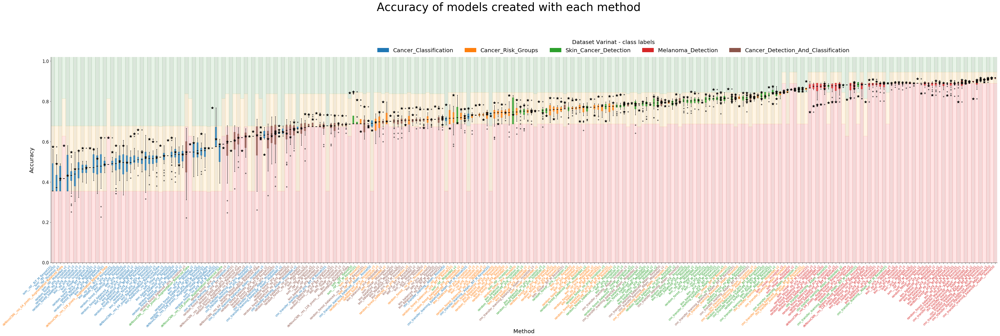

In [87]:
new_method_comparison_boxplot(                          
    title=f"Accuracy of models created with each method\n", 
    
    # ......................................................
    data                   = temp_summary_df,#.iloc[0:500,:]         # pd.DataFrame with the results,   
    col_with_group_ID      = "plot__method_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
    col_with_group_names   = "plot__box_names",        # df colname with values that will be displayed as names of each box (these do not have to be unique)
    col_with_group_colors  = "plot__color_group",      # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
    # ...
    col_with_baseline      ="baseline_acc_test",
    col_with_results       ="model_acc_test",       # df colname with values to display, eg: test_accuracy ...

    # ......................................................    
    figsize=(60, 15),
    col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
    full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
                                # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
    # ... colors
    cmap="tab10",
    cmap_colors_from=0,
    cmap_colors_to=0.5,                               
    
    # .. legend
    legend_title="Dataset Varinat - class labels",
    legend__bbox_to_anchor=(0.7, 0.99),
    subplots_adjust_top = 0.8,
    legend_ncols=5,
    
    # .. baseline
    baseline_title = "",
    baseline_loc =-0.09,
    use_fixed_baselines = False,
    baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
    baseline_color_list = ["red", "orange", "forestgreen"],
    
    # ... fontsizes
    title_fontsize=40,
    legend_fontsize=20,
    xticks_fontsize=10,
    yticks_fontsize=15,
    axes_labels_fontsize=20,
    
    # ... axies labels
    xaxis_label = "Method",
    yaxis_label = "Accuracy\n",
    paint_xticks=True,
    # ... scatterpoints for full models,
    add_full_models_markers =True, # if False, they are oging to be part of the barplots
    full_model_marker ="*",
    full_model_markersize=80,
    full_model_markercolor="black"
)

In [15]:
summary_df.columns 

Index(['C', 'EarlyStopping__patience', 'Unnamed: 0', 'baseline_acc_test',
       'baseline_acc_test_2', 'baseline_acc_train', 'baseline_acc_valid',
       'batch_size', 'class_weight', 'dataset_name', 'dataset_variant',
       'early_strop', 'epoch', 'f1_dropout', 'f1_units', 'fit__batch_size',
       'fit__epoch', 'gamma', 'h1_Dropout', 'h1_activation', 'h1_unit_size',
       'img_size', 'kernel', 'loss_acc_test', 'loss_acc_test_2',
       'loss_acc_train', 'loss_acc_valid', 'max_depth', 'method',
       'method_group', 'method_variant', 'metrics', 'model', 'model_ID',
       'model_acc_test', 'model_acc_test_2', 'model_acc_train',
       'model_acc_valid', 'model_loss_test', 'model_loss_test_2',
       'model_loss_train', 'model_loss_valid', 'module', 'n_estimators',
       'n_neighbors', 'new_dataset_name', 'new_method_group',
       'new_method_name', 'optimizer', 'out_activation', 'p', 'pc', 'pca',
       'pca_components_used', 'random_state', 'random_state_nr', 'run_name',
      

# comapre sensitivity, specificity and accuracy in all methods and techniques on one plot


 * plot__method_name * 
 - group size:  255
['Cancer_Classification__knn__no_pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__BiT_M_Resnet101'
 'Cancer_Risk_Groups__knn__pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__Resnet50'
 'Skin_Cancer_Detection__knn__no_pca__MobileNet_v2']

 * plot__color_group * 
 - group size:  5
['Cancer_Classification' 'Cancer_Risk_Groups' 'Skin_Cancer_Detection'
 'Melanoma_Detection' 'Cancer_Detection_And_Classification']

 * plot__box_names * 
 - group size:  55
['knn__no_pca__BiT_M_Resnet101' 'knn__pca__BiT_M_Resnet101'
 'knn__pca__Resnet50' 'knn__no_pca__MobileNet_v2' 'knn__pca__MobileNet_v2']

 * plot__method_name * 
 - group size:  255
['Cancer_Classification__knn__no_pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__BiT_M_Resnet101'
 'Cancer_Risk_Groups__knn__pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__Resnet50'
 'Skin_Cancer_Detection__knn__no_pca__MobileNet_v2']

 * plot__color_group * 
 - group size:  5
['Cance

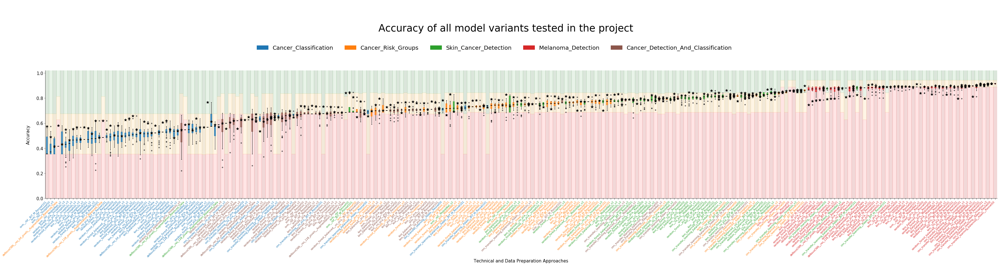

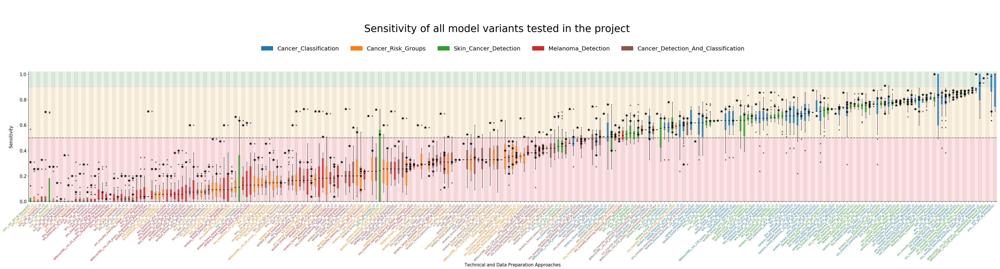

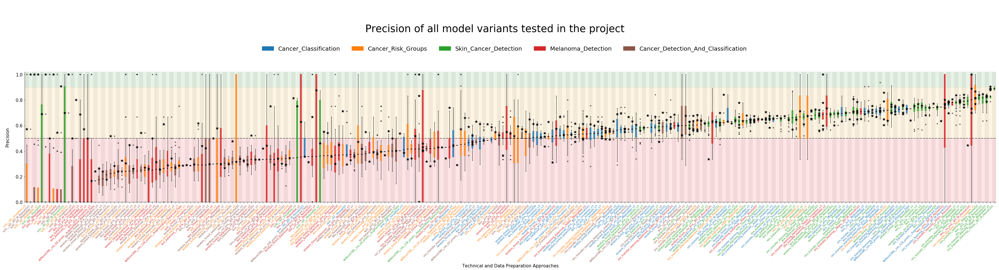

In [127]:
# repeat plots for accuracy, presission and sensitivity

TITLE_DESCRIPTION_LIST    = ["Accuracy", "Sensitivity", "Precision"]
FEATURE_NAME_LIST         = ["model_acc_test","STATS_recall_score_test", "STATS_precision_score_test"]
FIXED_BASEZONES_BOOL_LIST = [False, True, True]


for title_description, feature_name, plot_fixed_bacground in zip(TITLE_DESCRIPTION_LIST, FEATURE_NAME_LIST, FIXED_BASEZONES_BOOL_LIST):

    ## step 1. evaluate accuracy/
    temp_summary_df = summary_df
    temp_summary_df = create_new_variable(temp_summary_df, "plot__method_name", ["dataset_variant", "new_method_name", "method_variant", "module"]) # group data to display as separate boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["dataset_variant"]) # gives color to boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__box_names", ["new_method_name", "method_variant", "module"]) # these may have duplicates, 


    ## step 2. set colors form boxes(tick labels) for all plots
    #          - funciton that maps colors onto color_groups_names
    color_group_dict = create_class_colors_dict(
            list_of_unique_names=temp_summary_df.plot__color_group.unique(),
            cmap_name="tab10", 
            cmap_colors_from=0, 
            cmap_colors_to=0.5
        )   

    ## step 3. make separate plot for each datset variant,
    #for dataset_variant in  DATASET_VARIANTS:
    t=True
    if t==True:
    
    
        # SUBSET DATA FOR ONE BOXPLOT - wre plots all ogf them together
        # SUB_temp_summary_df = temp_summary_df.loc[temp_summary_df.dataset_variant==dataset_variant, :]
        SUB_temp_summary_df = temp_summary_df

        # MAKE BOXPLOT
        new_method_comparison_boxplot(                          
            title=f"{title_description} of all model variants tested in the project",    # PLOT TITLE 

            # ......................................................
            data                   = SUB_temp_summary_df,#.iloc[0:500,:]         # pd.DataFrame with the results,   
            col_with_group_ID      = "plot__method_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
            col_with_group_names   = "plot__box_names",        # df colname with values that will be displayed as names of each box (these do not have to be unique)
            col_with_group_colors  = "plot__color_group",      # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
            # ... 
            col_with_baseline      = "baseline_acc_test",
            col_with_results       = feature_name,       # df colname with values to display, eg: test_accuracy ...

            # ......................................................    
            figsize=(60, 10),
            col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
            full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
                                        # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
            # ... colors
            color_group_dict=color_group_dict,
            cmap="tab10",
            cmap_colors_from=0,
            cmap_colors_to=0.5,                               

            # .. legend
            legend_on=True,
            legend_title="",
            legend__bbox_to_anchor=(0.6, 1.1),
            subplots_adjust_top = 0.75,
            legend_ncols=5,

            # .. baseline
            baseline_title = "",
            baseline_loc =-0.09,
            use_fixed_baselines = plot_fixed_bacground,
            baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
            baseline_color_list = ["red", "orange", "forestgreen"],

            # ... fontsizes
            title_fontsize=35,
            legend_fontsize=20,
            xticks_fontsize=9,
            yticks_fontsize=15,
            axes_labels_fontsize=15,

            # ... axies labels
            xaxis_label = "Technical and Data Preparation Approaches",
            yaxis_label = f"{title_description}\n",
            paint_xticks=True,
            # ... scatterpoints for full models,
            add_full_models_markers =True, # if False, they are oging to be part of the barplots
            full_model_marker ="*",
            full_model_markersize=80,
            full_model_markercolor="black"
        )

# Evaluate whther acc corr with sensitivity and sesitivit with prec

In [44]:
temp_summary_df.columns

Index(['C', 'EarlyStopping__patience', 'Unnamed: 0', 'baseline_acc_test',
       'baseline_acc_test_2', 'baseline_acc_train', 'baseline_acc_valid',
       'batch_size', 'class_weight', 'dataset_name', 'dataset_variant',
       'early_strop', 'epoch', 'f1_dropout', 'f1_units', 'fit__batch_size',
       'fit__epoch', 'gamma', 'h1_Dropout', 'h1_activation', 'h1_unit_size',
       'img_size', 'kernel', 'loss_acc_test', 'loss_acc_test_2',
       'loss_acc_train', 'loss_acc_valid', 'max_depth', 'method',
       'method_group', 'method_variant', 'metrics', 'model', 'model_ID',
       'model_acc_test', 'model_acc_test_2', 'model_acc_train',
       'model_acc_valid', 'model_loss_test', 'model_loss_test_2',
       'model_loss_train', 'model_loss_valid', 'module', 'n_estimators',
       'n_neighbors', 'new_dataset_name', 'new_method_group',
       'new_method_name', 'optimizer', 'out_activation', 'p', 'pc', 'pca',
       'pca_components_used', 'random_state', 'random_state_nr', 'run_name',
      

In [74]:
temp_summary_df = summary_df
temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["new_method_name"]) # gives color to boxes
temp_summary_df.plot__color_group = temp_summary_df.plot__color_group.str.replace("_balanced", "")
temp_summary_df.plot__color_group.unique()


 * plot__color_group * 
 - group size:  8
['knn' 'random_forest' 'svm' 'cnn_transfer_learning' 'deNovoCNN']


array(['knn', 'random_forest', 'svm', 'cnn_transfer_learning',
       'deNovoCNN'], dtype=object)

In [70]:
for rnr in range(temp_summary_df.shape[0]):
    if pd.Series([temp_summary_df.plot__color_group.iloc[rnr]]).str.contains("_balanced")[0]:
        temp_summary_df.plot__color_group.iloc[rnr] = pd.Series(temp_summary_df.plot__color_group.iloc[rnr]).str.replace("_balanced", "")
    else:
        pass

ValueError: No axis named 1 for object type <class 'type'>


 * plot__color_group * 
 - group size:  8
['knn' 'random_forest' 'svm' 'cnn_transfer_learning' 'deNovoCNN']


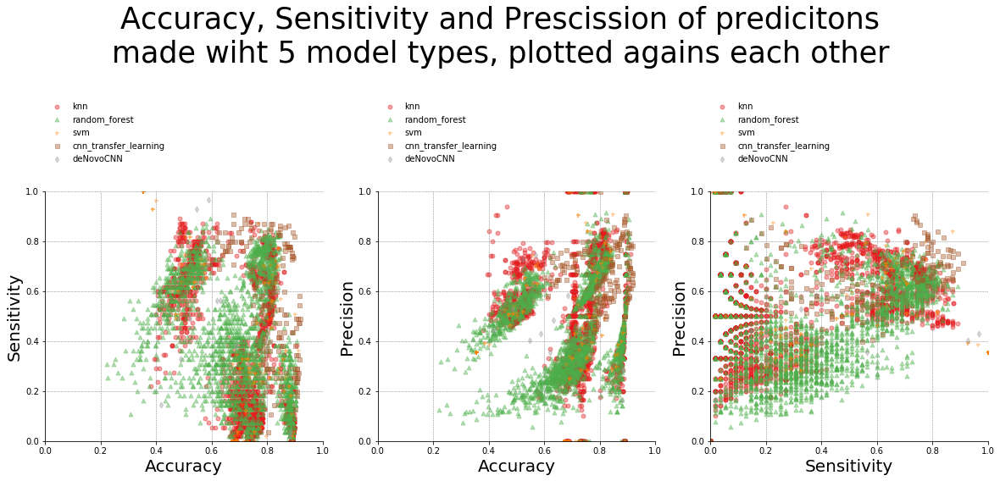

In [93]:
# repeat plots for accuracy, presission and sensitivity

TITLE_DESCRIPTION_LIST    = ["Accuracy", "Sensitivity", "Precision"]
FEATURE_NAME_LIST         = ["model_acc_test","STATS_recall_score_test", "STATS_precision_score_test"]
feature_combination_list  = [(0,1), (0,2), (1,2)]

# ... prep variable to distinguis diffeerrnt series of data points
temp_summary_df = summary_df
temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["new_method_name"]) # gives color to boxes
temp_summary_df.plot__color_group = temp_summary_df.plot__color_group.str.replace("_balanced", "")


#...set colors form boxes(tick labels) for all plots
#          - funciton that maps colors onto color_groups_names
color_group_dict = create_class_colors_dict(
            list_of_unique_names=temp_summary_df.plot__color_group.unique(),
            cmap_name="Set1", 
            cmap_colors_from=0, 
            cmap_colors_to=1
        )   

# -1- plot
# subplot
fig, axs = plt.subplots(nrows=1, ncols=len(feature_combination_list),figsize=(5.5*len(feature_combination_list),8))
fig.suptitle("Accuracy, Sensitivity and Prescission of predicitons\nmade wiht 5 model types, plotted agains each other\n", fontsize=35)
for ax, feature_combination in zip(axs.flat, feature_combination_list):

    # prepare data
    
    xy_series      = temp_summary_df.plot__color_group
    xy_series_name = temp_summary_df.new_method_name
    x_data         = temp_summary_df.loc[:, FEATURE_NAME_LIST[feature_combination[0]]]
    y_data         = temp_summary_df.loc[:, FEATURE_NAME_LIST[feature_combination[1]]]
    xaxis_label    = TITLE_DESCRIPTION_LIST[feature_combination[0]]
    yaxis_label    = TITLE_DESCRIPTION_LIST[feature_combination[1]]

    
    # I have an error that could generate duplicated columns, this will remove them,. 
    if  x_data.ndim>1:
        x_data = x_data.iloc[:,0]
    else:
        pass
    if  y_data.ndim>1:
        y_data = y_data.iloc[:,0]
    else:
        pass
    
    
    
    # plot each series
    my_markers=["o", "^", "+", "s", "d", ">", "<"]
    for ii, one_data_series in enumerate(xy_series.unique().tolist()):
        
        ax.scatter(
            x=x_data.loc[xy_series==one_data_series], 
            y=y_data.loc[xy_series==one_data_series], 
            color=color_group_dict[one_data_series],
            alpha=0.4, label=xy_series_name.loc[xy_series==one_data_series].iloc[0],
            s=25, marker=my_markers[ii]
        )

    ax.set(ylim=(0,1), xlim=(0,1))
    ax.set_xlabel(xaxis_label, fontsize=20)
    ax.set_ylabel(yaxis_label, fontsize=20)
    ax.grid(color="grey", ls="--", lw=0.5)
    sns.despine()
    ax.legend(loc=(0, 1.1), frameon=False)

fig.tight_layout()
fig.subplots_adjust(top=0.6)



















In [33]:
y_data.loc[xy_series==one_data_series].shape

(1008,)

In [46]:
x_data.ndim

2


 * plot__color_group * 
 - group size:  5
['Cancer_Classification' 'Cancer_Risk_Groups' 'Skin_Cancer_Detection'
 'Melanoma_Detection' 'Cancer_Detection_And_Classification']


ValueError: x and y must be the same size

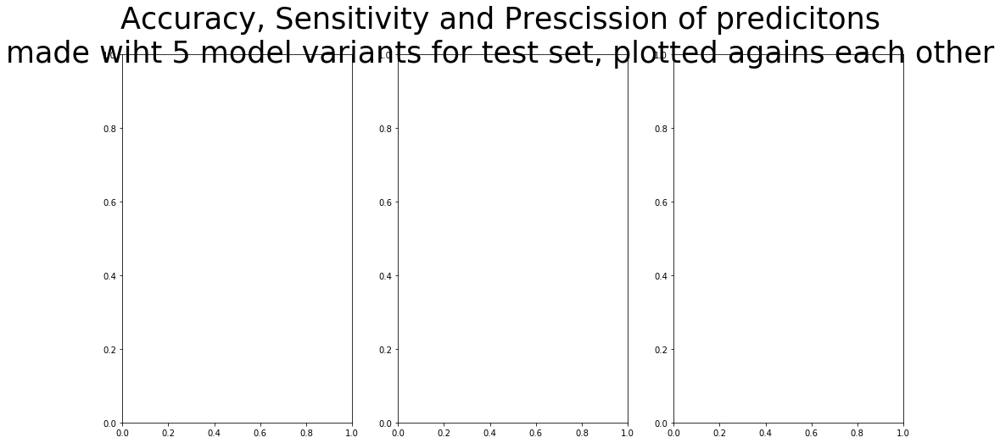

In [13]:
# repeat plots for accuracy, presission and sensitivity

TITLE_DESCRIPTION_LIST    = ["Accuracy", "Sensitivity", "Precision"]
FEATURE_NAME_LIST         = ["model_acc_test","STATS_recall_score_test", "STATS_precision_score_test"]
feature_combination_list  = [(0,1), (0,2), (1,2)]

# ... prep variable to distinguis diffeerrnt series of data points
temp_summary_df = summary_df
temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["dataset_variant"]) # gives color to boxes


#...set colors form boxes(tick labels) for all plots
#          - funciton that maps colors onto color_groups_names
color_group_dict = create_class_colors_dict(
            list_of_unique_names=temp_summary_df.plot__color_group.unique(),
            cmap_name="tab10", 
            cmap_colors_from=0, 
            cmap_colors_to=0.5
        )   

# -1- plot
# subplot
fig, axs = plt.subplots(nrows=1, ncols=len(feature_combination_list),figsize=(5.5*len(feature_combination_list),8))
fig.suptitle("Accuracy, Sensitivity and Prescission of predicitons\nmade wiht 5 model variants for test set, plotted agains each other\n", fontsize=35)
for ax, feature_combination in zip(axs.flat, feature_combination_list):

    # prepare data
    
    xy_series      = temp_summary_df.plot__color_group
    xy_series_name = temp_summary_df.dataset_variant
    x_data         = temp_summary_df.loc[:, FEATURE_NAME_LIST[feature_combination[0]]]
    y_data         = temp_summary_df.loc[:, FEATURE_NAME_LIST[feature_combination[1]]]
    xaxis_label    = TITLE_DESCRIPTION_LIST[feature_combination[0]]
    yaxis_label    = TITLE_DESCRIPTION_LIST[feature_combination[1]]

    
    # plot each series
    for one_data_series in xy_series.unique():
        
        ax.scatter(
            x=x_data.loc[xy_series==one_data_series], 
            y=y_data.loc[xy_series==one_data_series], 
            color=color_group_dict[one_data_series],
            alpha=0.5, label=xy_series_name.loc[xy_series==one_data_series].iloc[0]
        )

    ax.set(ylim=(0,1), xlim=(0,1))
    ax.set_xlabel(xaxis_label, fontsize=20)
    ax.set_ylabel(yaxis_label, fontsize=20)
    ax.grid(color="grey", ls="--", lw=0.5)
    sns.despine()
    ax.legend(loc=(0, 1.1), frameon=False)

fig.tight_layout()
fig.subplots_adjust(top=0.6)




















# evaluate on plots whther some tf hubs improved results and how did they compared to data augmentaiton prodedures implemented in de novo models, 


 * plot__method_name * 
 - group size:  25
['Cancer_Classification__BiT_M_Resnet101'
 'Cancer_Risk_Groups__BiT_M_Resnet101' 'Cancer_Classification__Resnet50'
 'Skin_Cancer_Detection__MobileNet_v2' 'Melanoma_Detection__Inception_v3']

 * plot__color_group * 
 - group size:  5
['BiT_M_Resnet101' 'Resnet50' 'MobileNet_v2' 'Inception_v3'
 'Augmentation_Balanced_Data']

 * plot__box_names * 
 - group size:  5
['BiT_M_Resnet101' 'Resnet50' 'MobileNet_v2' 'Inception_v3'
 'Augmentation_Balanced_Data']

 * plot__method_name * 
 - group size:  25
['Cancer_Classification__BiT_M_Resnet101'
 'Cancer_Risk_Groups__BiT_M_Resnet101' 'Cancer_Classification__Resnet50'
 'Skin_Cancer_Detection__MobileNet_v2' 'Melanoma_Detection__Inception_v3']

 * plot__color_group * 
 - group size:  5
['BiT_M_Resnet101' 'Resnet50' 'MobileNet_v2' 'Inception_v3'
 'Augmentation_Balanced_Data']

 * plot__box_names * 
 - group size:  5
['BiT_M_Resnet101' 'Resnet50' 'MobileNet_v2' 'Inception_v3'
 'Augmentation_Balanced_Data']


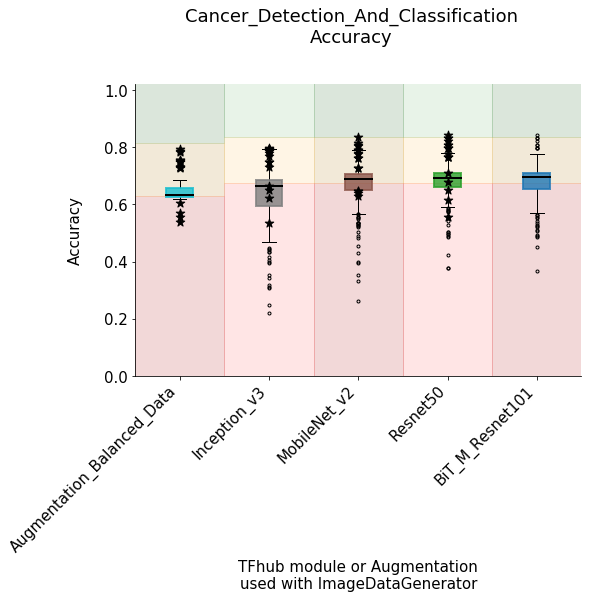

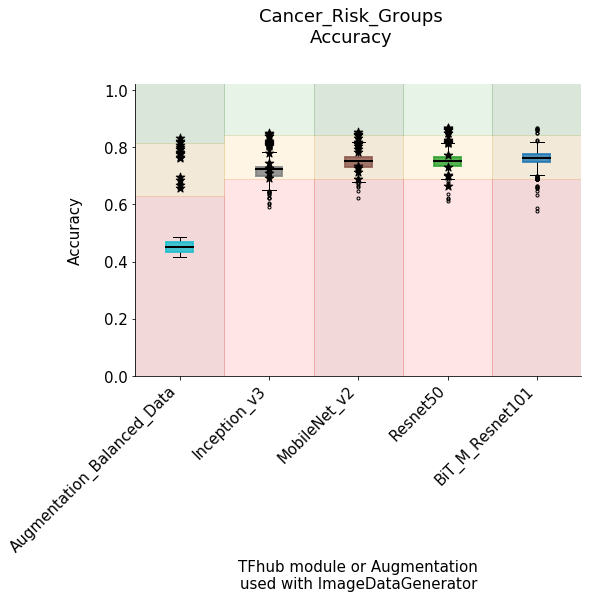

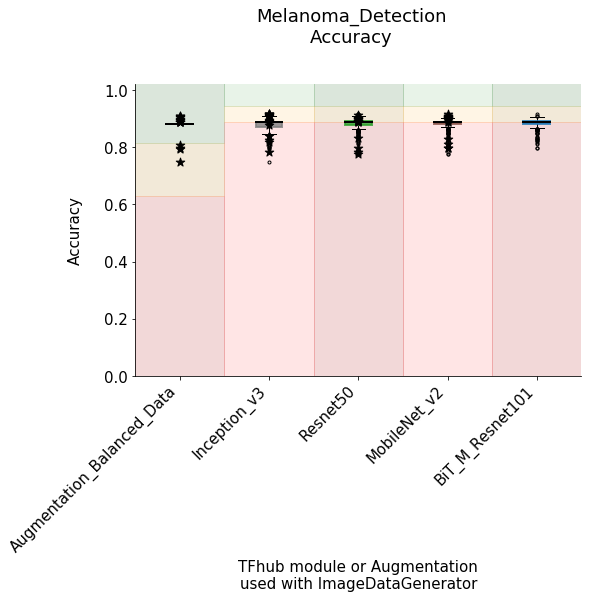

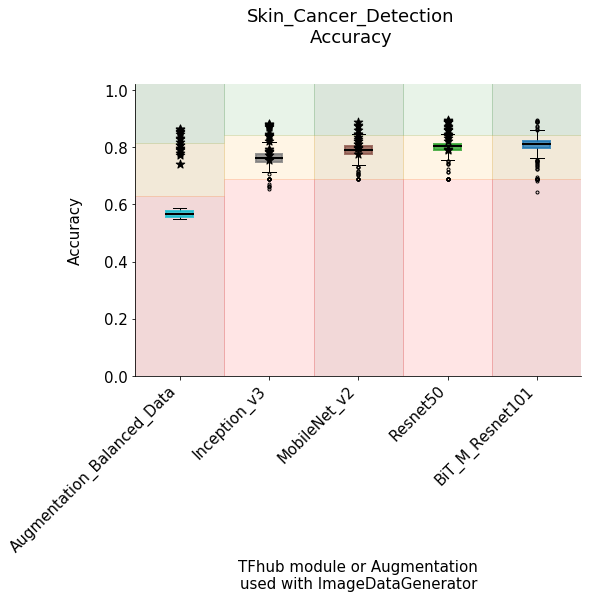

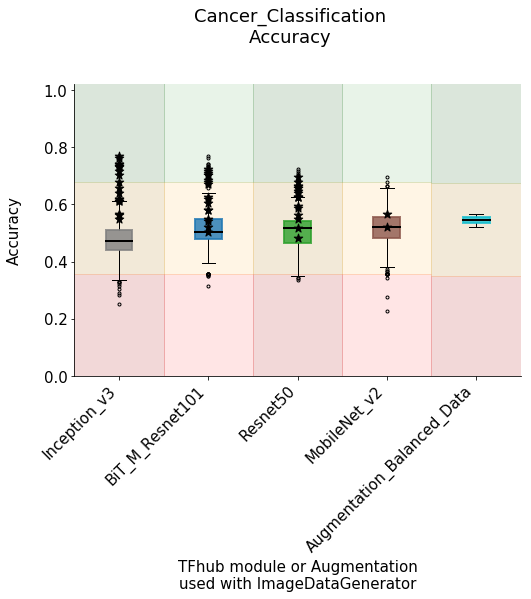

...

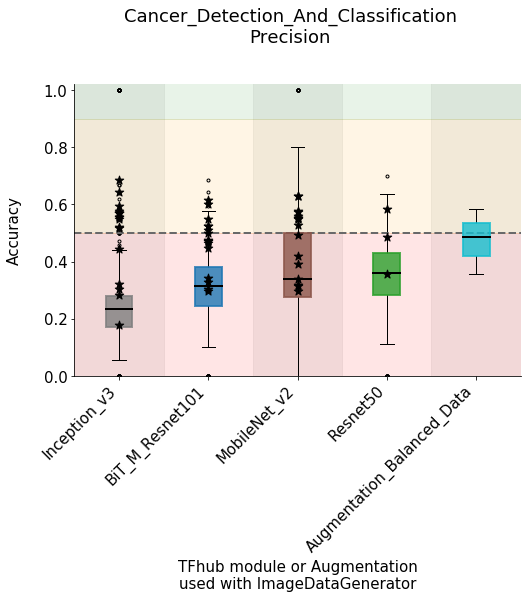

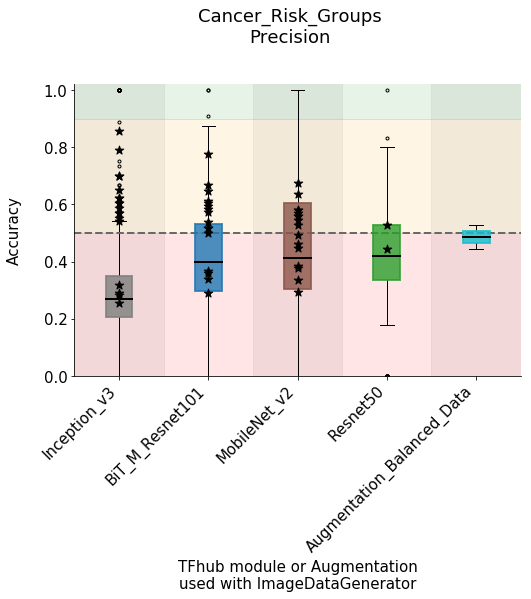

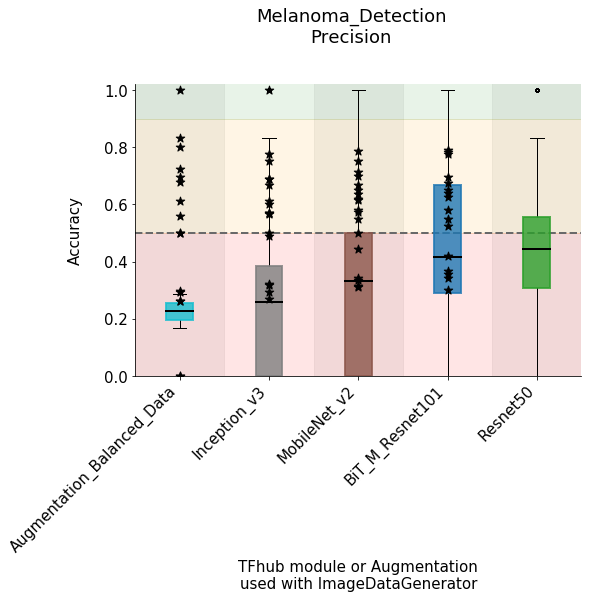

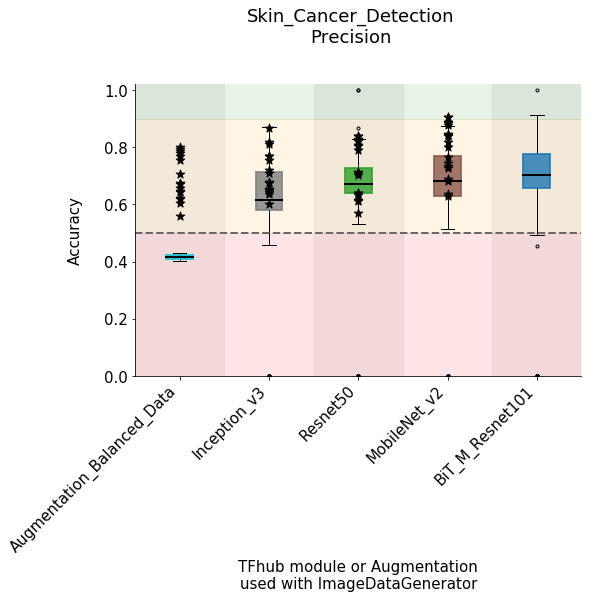

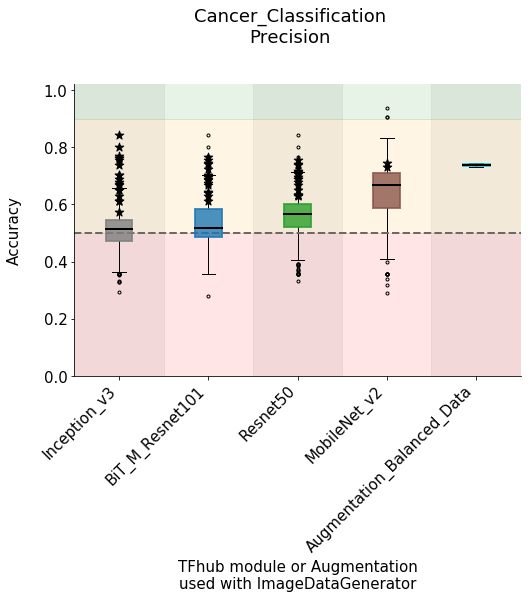

In [118]:
# repeat plots for accuracy, presission and sensitivity

TITLE_DESCRIPTION_LIST    = ["Accuracy", "Sensitivity", "Precision"]
FEATURE_NAME_LIST         = ["model_acc_test","STATS_recall_score_test", "STATS_precision_score_test"]
FIXED_BASEZONES_BOOL_LIST = [False, True, True]


for title_description, feature_name, plot_fixed_bacground in zip(TITLE_DESCRIPTION_LIST, FEATURE_NAME_LIST, FIXED_BASEZONES_BOOL_LIST):

    ## step 1. evaluate accuracy/
    temp_summary_df = summary_df
    temp_summary_df = create_new_variable(temp_summary_df, "plot__method_name", ["dataset_variant", "module"]) # group data to display as separate boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["module"]) # gives color to boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__box_names", ["module"]) # these may have duplicates,


    ## step 2. set colors form boxes(tick labels) for all plots
    #          - funciton that maps colors onto color_groups_names
    color_group_dict = create_class_colors_dict(
            list_of_unique_names=temp_summary_df.plot__color_group.unique(),
            cmap_name="tab10", 
            cmap_colors_from=0, 
            cmap_colors_to=1
        )   

    ## step 3. make separate plot for each datset variant,
    for dataset_variant in  DATASET_VARIANTS:

        # SUBSET DATA FOR ONE BOXPLOT
        SUB_temp_summary_df = temp_summary_df.loc[temp_summary_df.dataset_variant==dataset_variant, :]

        # MAKE BOXPLOT
        new_method_comparison_boxplot(                          
            title=f"{dataset_variant}\n{title_description}",    # PLOT TITLE 

            # ......................................................
            data                   = SUB_temp_summary_df,#.iloc[0:500,:]         # pd.DataFrame with the results,   
            col_with_group_ID      = "plot__method_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
            col_with_group_names   = "plot__box_names",        # df colname with values that will be displayed as names of each box (these do not have to be unique)
            col_with_group_colors  = "plot__color_group",      # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
            # ... 
            col_with_baseline      = "baseline_acc_test",
            col_with_results       = feature_name,       # df colname with values to display, eg: test_accuracy ...

            # ......................................................    
            figsize=(8, 6),
            col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
            full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
                                        # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
            # ... colors
            color_group_dict=color_group_dict,
            cmap="tab10",
            cmap_colors_from=0,
            cmap_colors_to=0.5,                               

            # .. legend
            legend_on=False,
            legend_title="",
            legend__bbox_to_anchor=(0.9, 0.85),
            subplots_adjust_top = 0.8,
            legend_ncols=3,

            # .. baseline
            baseline_title = "",
            baseline_loc =-0.09,
            use_fixed_baselines = plot_fixed_bacground,
            baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
            baseline_color_list = ["red", "orange", "forestgreen"],

            # ... fontsizes
            title_fontsize=18,
            legend_fontsize=15,
            xticks_fontsize=15,
            yticks_fontsize=15,
            axes_labels_fontsize=15,

            # ... axies labels
            xaxis_label = "TFhub module or Augmentation\nused with ImageDataGenerator",
            yaxis_label = "Accuracy\n",
            paint_xticks=False,
            # ... scatterpoints for full models,
            add_full_models_markers =True, # if False, they are oging to be part of the barplots
            full_model_marker ="*",
            full_model_markersize=80,
            full_model_markercolor="black"
        )


 * plot__method_name * 
 - group size:  255
['Cancer_Classification__knn__no_pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__BiT_M_Resnet101'
 'Cancer_Risk_Groups__knn__pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__Resnet50'
 'Skin_Cancer_Detection__knn__no_pca__MobileNet_v2']

 * plot__color_group * 
 - group size:  5
['Cancer_Classification' 'Cancer_Risk_Groups' 'Skin_Cancer_Detection'
 'Melanoma_Detection' 'Cancer_Detection_And_Classification']

 * plot__box_names * 
 - group size:  55
['knn__no_pca__BiT_M_Resnet101' 'knn__pca__BiT_M_Resnet101'
 'knn__pca__Resnet50' 'knn__no_pca__MobileNet_v2' 'knn__pca__MobileNet_v2']

 * plot__method_name * 
 - group size:  255
['Cancer_Classification__knn__no_pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__BiT_M_Resnet101'
 'Cancer_Risk_Groups__knn__pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__Resnet50'
 'Skin_Cancer_Detection__knn__no_pca__MobileNet_v2']

 * plot__color_group * 
 - group size:  5
['Cance

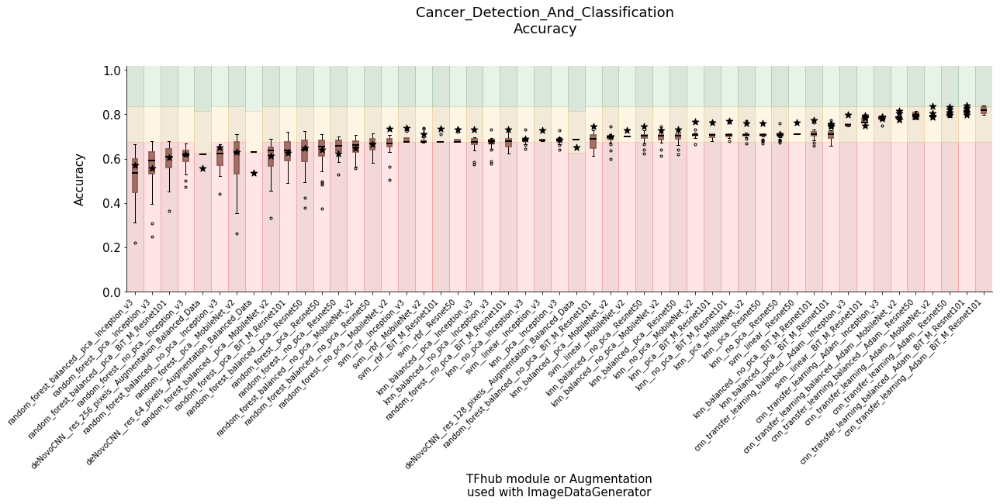

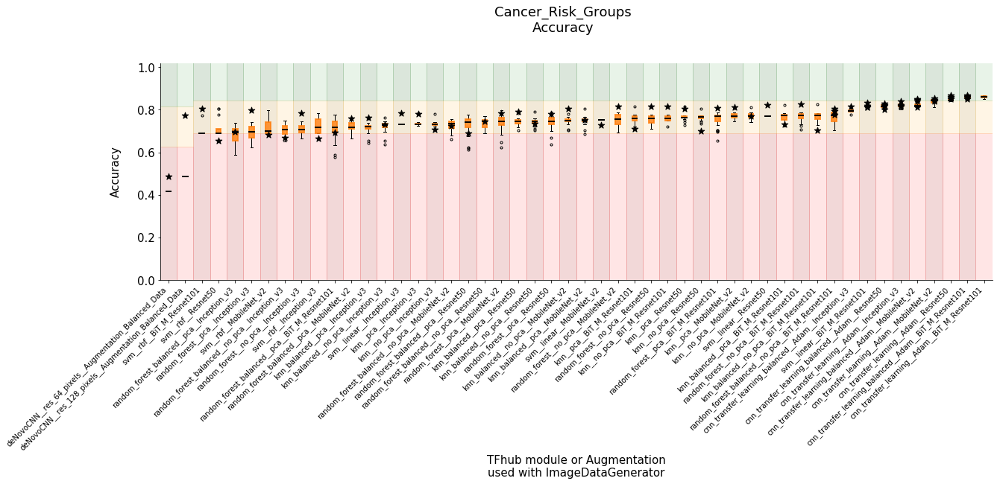

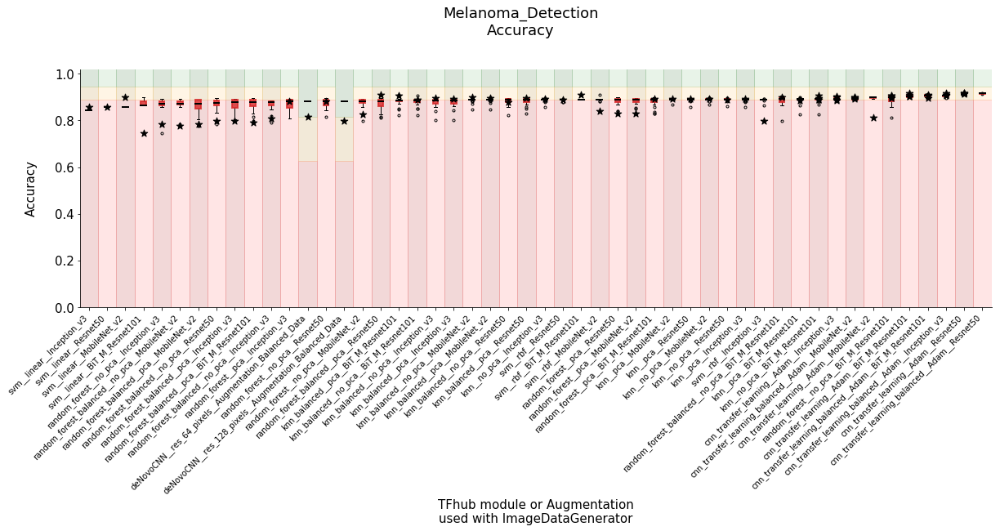

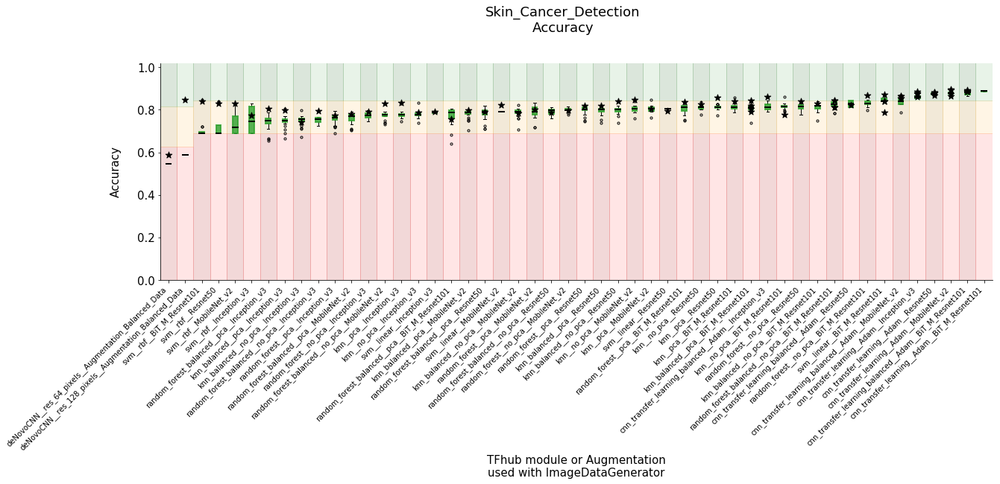

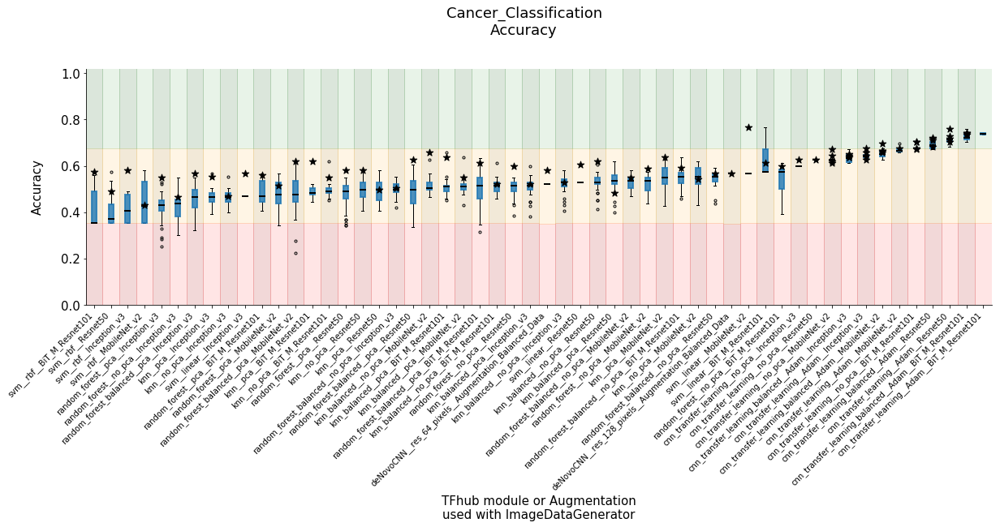

...

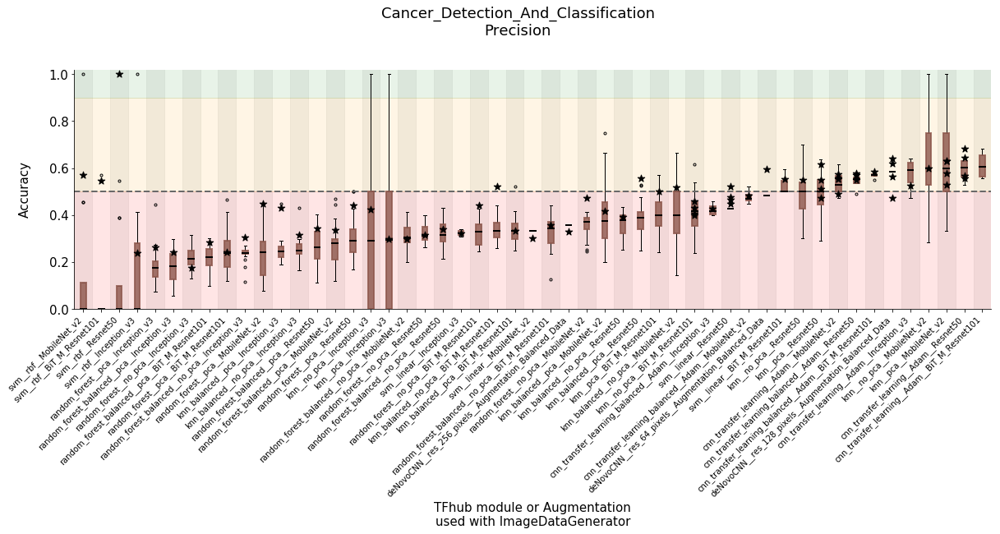

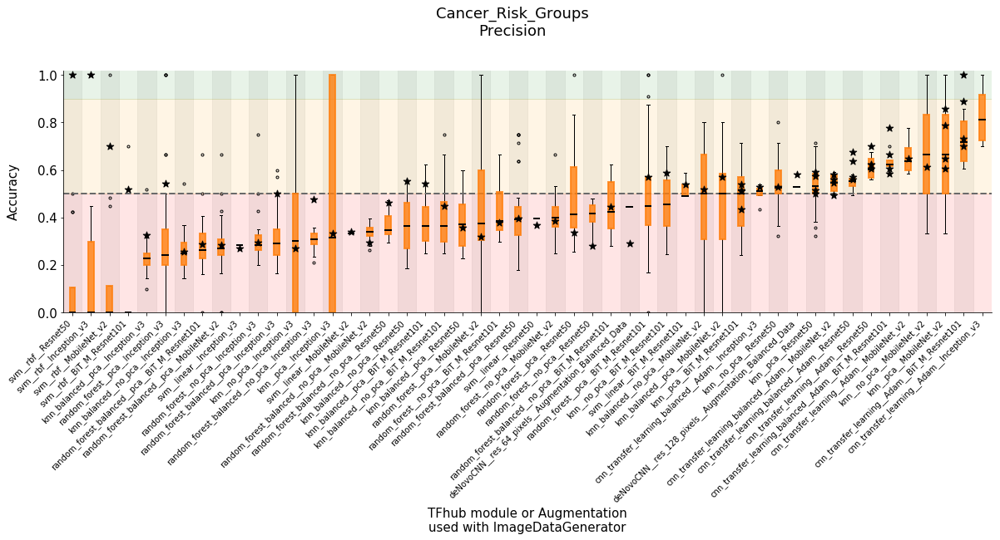

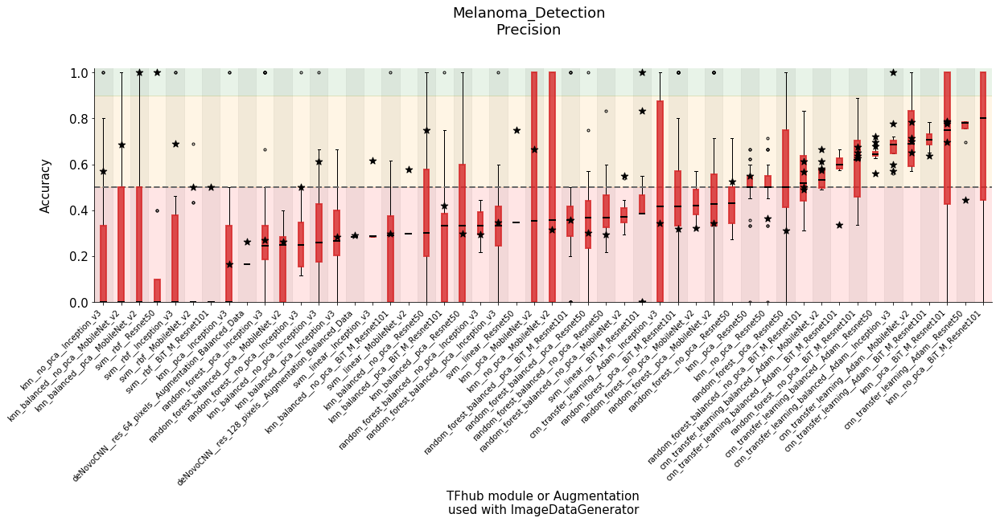

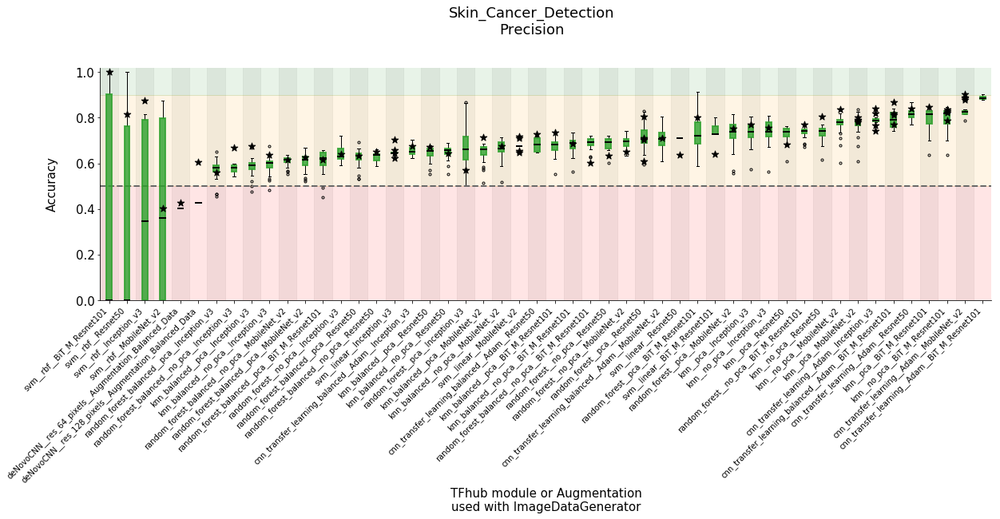

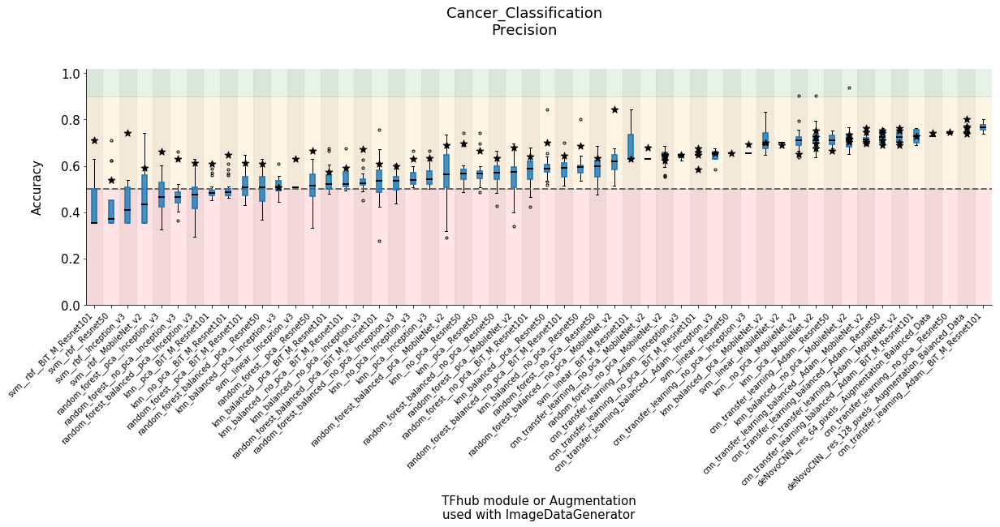

In [167]:
# repeat plots for accuracy, presission and sensitivity

TITLE_DESCRIPTION_LIST    = ["Accuracy", "Sensitivity", "Precision"]
FEATURE_NAME_LIST         = ["model_acc_test","STATS_recall_score_test", "STATS_precision_score_test"]
FIXED_BASEZONES_BOOL_LIST = [False, True, True]


for title_description, feature_name, plot_fixed_bacground in zip(TITLE_DESCRIPTION_LIST, FEATURE_NAME_LIST, FIXED_BASEZONES_BOOL_LIST):

    ## step 1. evaluate accuracy/
    temp_summary_df = summary_df
    temp_summary_df = create_new_variable(temp_summary_df, "plot__method_name", ["dataset_variant", "new_method_name", "method_variant", "module"]) # group data to display as separate boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["dataset_variant"]) # gives color to boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__box_names", ["new_method_name", "method_variant", "module"]) # these may have duplicates, 


    ## step 2. set colors form boxes(tick labels) for all plots
    #          - funciton that maps colors onto color_groups_names
    color_group_dict = create_class_colors_dict(
            list_of_unique_names=temp_summary_df.plot__color_group.unique(),
            cmap_name="tab10", 
            cmap_colors_from=0, 
            cmap_colors_to=0.5
        )   

    ## step 3. make separate plot for each datset variant,
    for dataset_variant in  DATASET_VARIANTS:

        # SUBSET DATA FOR ONE BOXPLOT
        SUB_temp_summary_df = temp_summary_df.loc[temp_summary_df.dataset_variant==dataset_variant, :]

        # MAKE BOXPLOT
        new_method_comparison_boxplot(                          
            title=f"{dataset_variant}\n{title_description}",    # PLOT TITLE 

            # ......................................................
            data                   = SUB_temp_summary_df,#.iloc[0:500,:]         # pd.DataFrame with the results,   
            col_with_group_ID      = "plot__method_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
            col_with_group_names   = "plot__box_names",        # df colname with values that will be displayed as names of each box (these do not have to be unique)
            col_with_group_colors  = "plot__color_group",      # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
            # ... 
            col_with_baseline      = "baseline_acc_test",
            col_with_results       = feature_name,       # df colname with values to display, eg: test_accuracy ...

            # ......................................................    
            figsize=(20, 6),
            col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
            full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
                                        # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
            # ... colors
            color_group_dict=color_group_dict,
            cmap="tab10",
            cmap_colors_from=0,
            cmap_colors_to=0.5,                               

            # .. legend
            legend_on=False,
            legend_title="",
            legend__bbox_to_anchor=(0.9, 0.85),
            subplots_adjust_top = 0.8,
            legend_ncols=3,

            # .. baseline
            baseline_title = "",
            baseline_loc =-0.09,
            use_fixed_baselines = plot_fixed_bacground,
            baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
            baseline_color_list = ["red", "orange", "forestgreen"],

            # ... fontsizes
            title_fontsize=18,
            legend_fontsize=15,
            xticks_fontsize=10,
            yticks_fontsize=15,
            axes_labels_fontsize=15,

            # ... axies labels
            xaxis_label = "TFhub module or Augmentation\nused with ImageDataGenerator",
            yaxis_label = "Accuracy\n",
            paint_xticks=False,
            # ... scatterpoints for full models,
            add_full_models_markers =True, # if False, they are oging to be part of the barplots
            full_model_marker ="*",
            full_model_markersize=80,
            full_model_markercolor="black"
        )

In [169]:
summary_df.new_dataset_name.unique()

array(['HAM10000', 'HAM10000_balanced'], dtype=object)


 * plot__method_name * 
 - group size:  255
['Cancer_Classification__knn__no_pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__BiT_M_Resnet101'
 'Cancer_Risk_Groups__knn__pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__Resnet50'
 'Skin_Cancer_Detection__knn__no_pca__MobileNet_v2']

 * plot__color_group * 
 - group size:  2
['HAM10000' 'HAM10000_balanced']

 * plot__box_names * 
 - group size:  55
['knn__no_pca__BiT_M_Resnet101' 'knn__pca__BiT_M_Resnet101'
 'knn__pca__Resnet50' 'knn__no_pca__MobileNet_v2' 'knn__pca__MobileNet_v2']

 * plot__method_name * 
 - group size:  255
['Cancer_Classification__knn__no_pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__BiT_M_Resnet101'
 'Cancer_Risk_Groups__knn__pca__BiT_M_Resnet101'
 'Cancer_Classification__knn__pca__Resnet50'
 'Skin_Cancer_Detection__knn__no_pca__MobileNet_v2']

 * plot__color_group * 
 - group size:  2
['HAM10000' 'HAM10000_balanced']

 * plot__box_names * 
 - group size:  55
['knn__no_pca__BiT_M_Resnet101

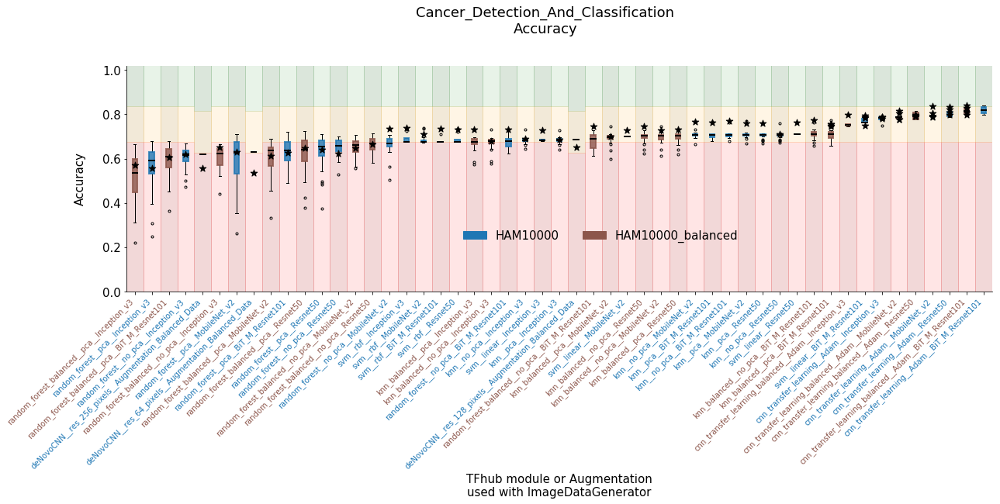

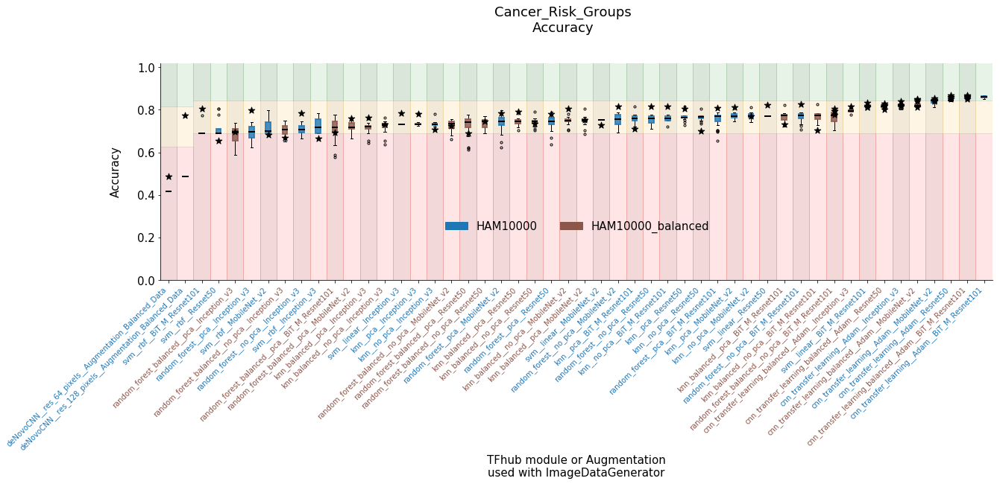

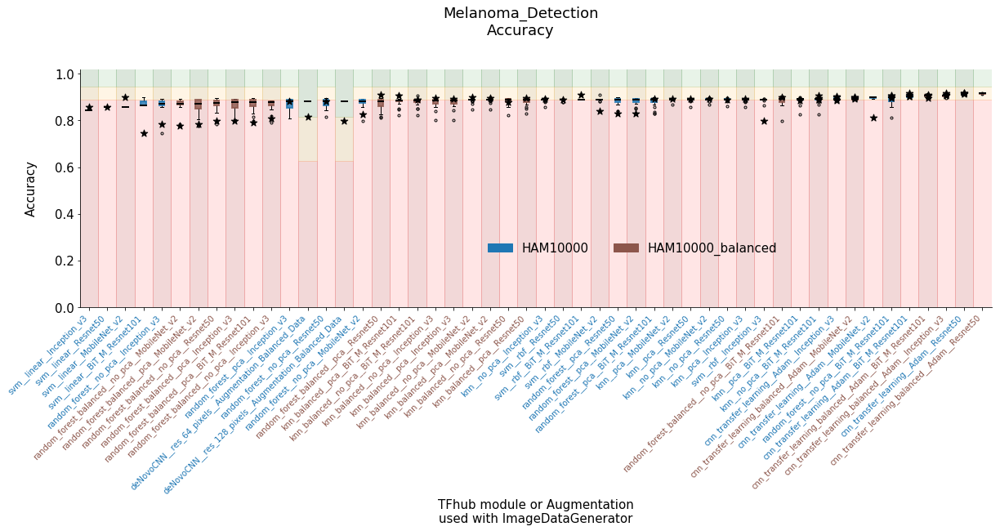

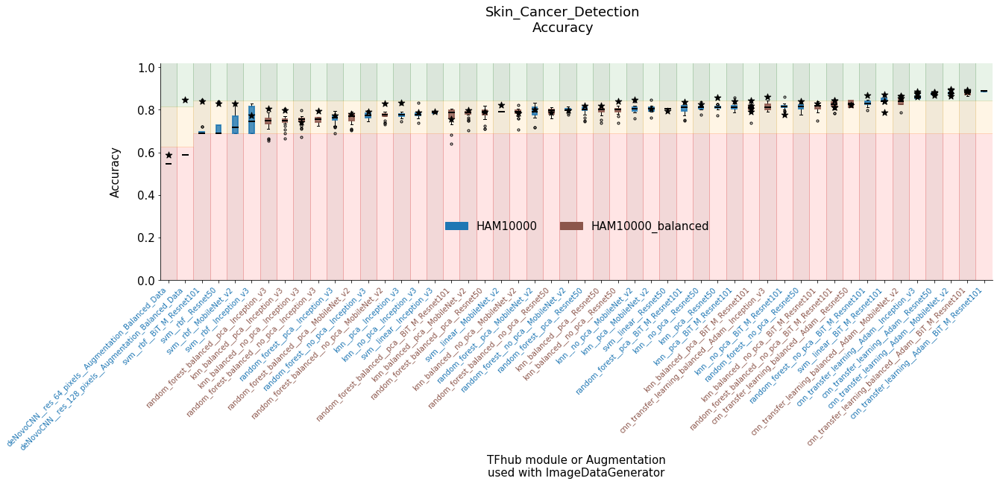

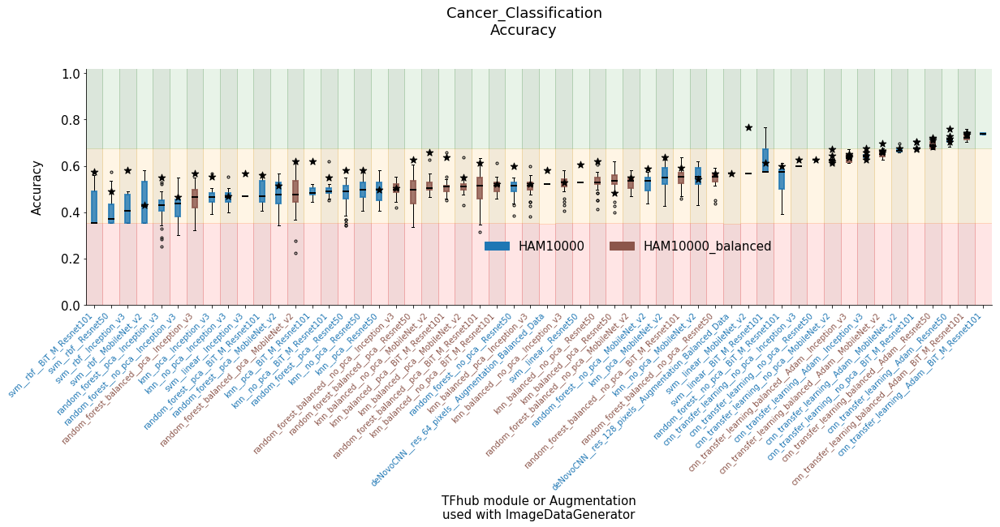

...

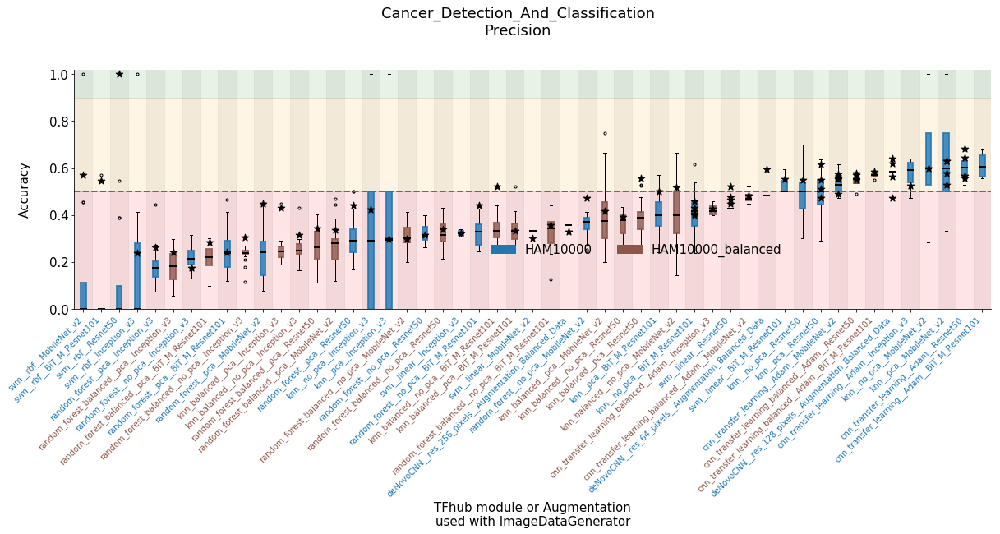

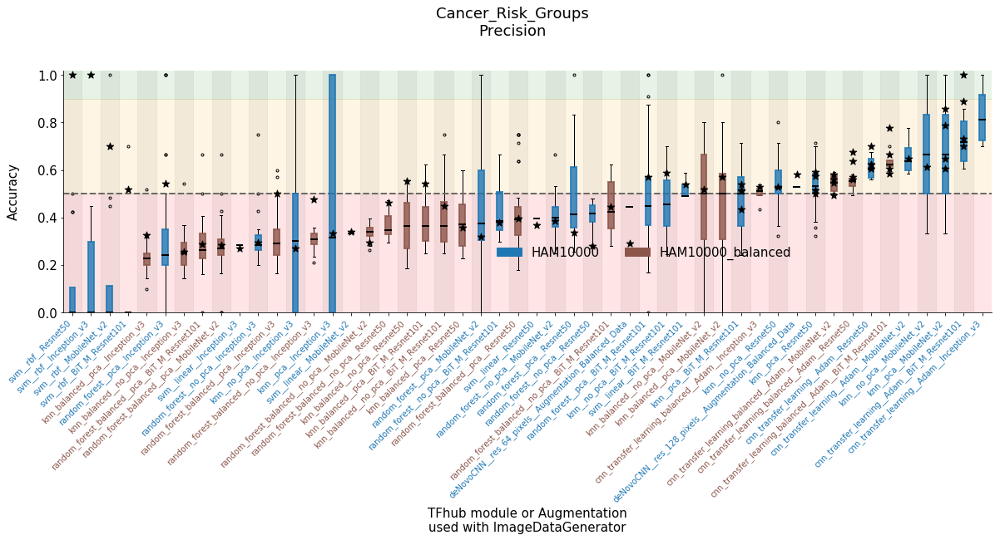

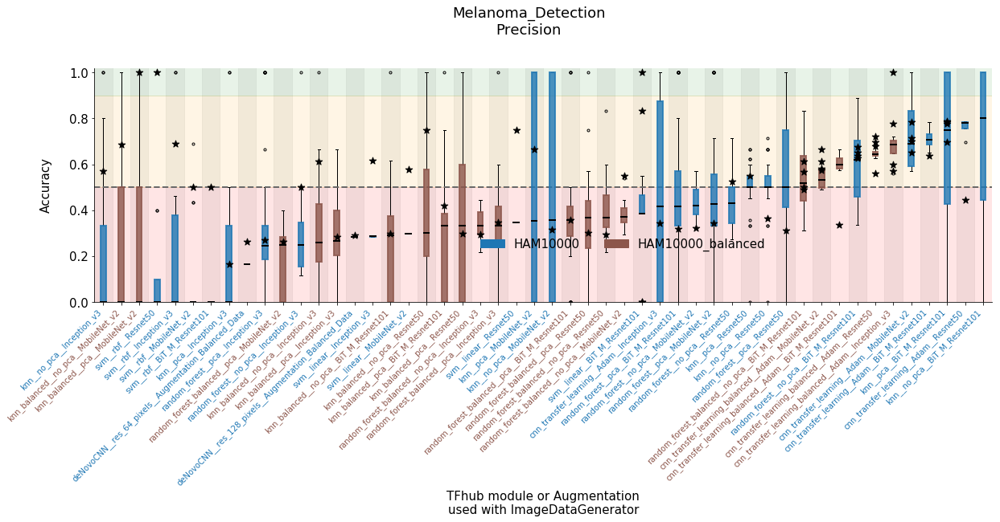

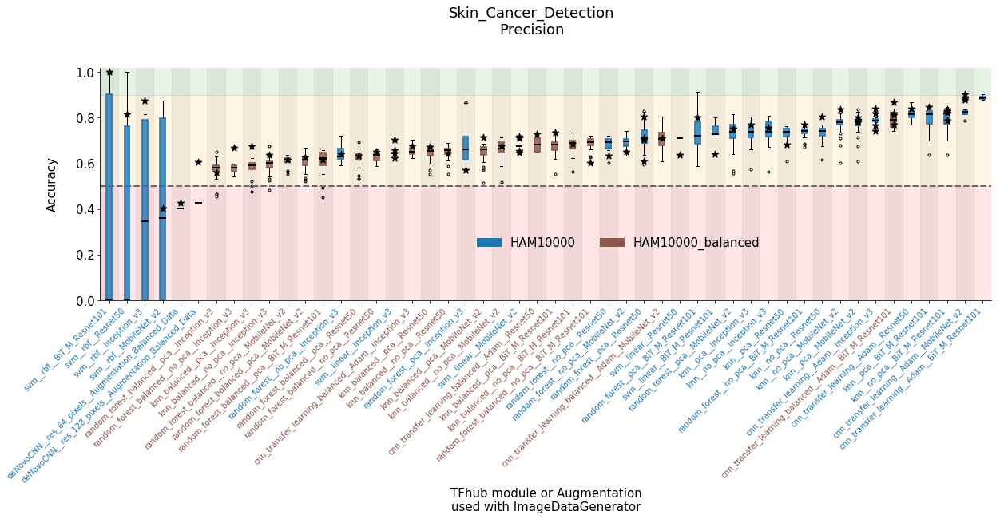

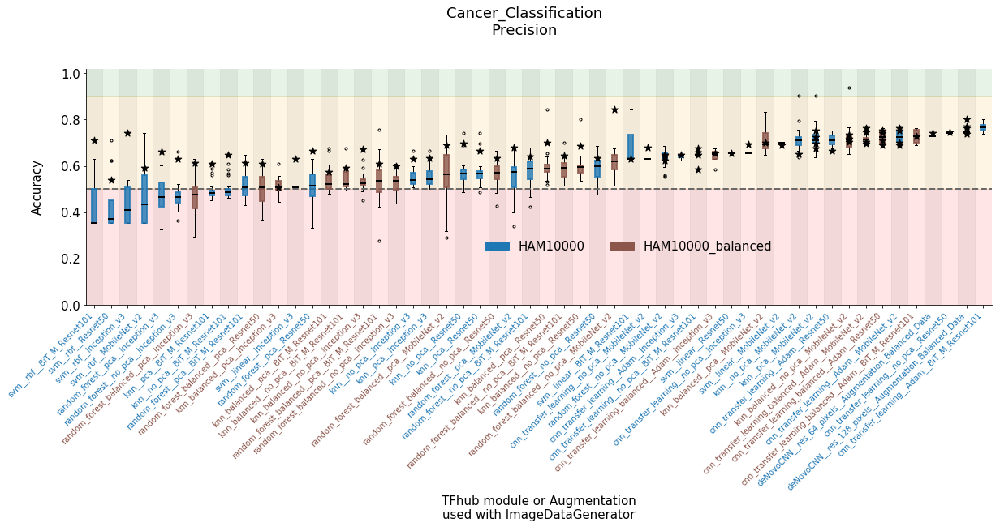

In [172]:
# repeat plots for accuracy, presission and sensitivity

TITLE_DESCRIPTION_LIST    = ["Accuracy", "Sensitivity", "Precision"]
FEATURE_NAME_LIST         = ["model_acc_test","STATS_recall_score_test", "STATS_precision_score_test"]
FIXED_BASEZONES_BOOL_LIST = [False, True, True]


for title_description, feature_name, plot_fixed_bacground in zip(TITLE_DESCRIPTION_LIST, FEATURE_NAME_LIST, FIXED_BASEZONES_BOOL_LIST):

    ## step 1. evaluate accuracy/
    temp_summary_df = summary_df
    temp_summary_df = create_new_variable(temp_summary_df, "plot__method_name", ["dataset_variant", "new_method_name", "method_variant", "module"]) # group data to display as separate boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__color_group", ["new_dataset_name"]) # gives color to boxes
    temp_summary_df = create_new_variable(temp_summary_df, "plot__box_names", ["new_method_name", "method_variant", "module"]) # these may have duplicates, 


    ## step 2. set colors form boxes(tick labels) for all plots
    #          - funciton that maps colors onto color_groups_names
    color_group_dict = create_class_colors_dict(
            list_of_unique_names=temp_summary_df.plot__color_group.unique(),
            cmap_name="tab10", 
            cmap_colors_from=0, 
            cmap_colors_to=0.5
        )   

    ## step 3. make separate plot for each datset variant,
    for dataset_variant in  DATASET_VARIANTS:

        # SUBSET DATA FOR ONE BOXPLOT
        SUB_temp_summary_df = temp_summary_df.loc[temp_summary_df.dataset_variant==dataset_variant, :]

        # MAKE BOXPLOT
        new_method_comparison_boxplot(                          
            title=f"{dataset_variant}\n{title_description}",    # PLOT TITLE 

            # ......................................................
            data                   = SUB_temp_summary_df,#.iloc[0:500,:]         # pd.DataFrame with the results,   
            col_with_group_ID      = "plot__method_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
            col_with_group_names   = "plot__box_names",        # df colname with values that will be displayed as names of each box (these do not have to be unique)
            col_with_group_colors  = "plot__color_group",      # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
            # ... 
            col_with_baseline      = "baseline_acc_test",
            col_with_results       = feature_name,       # df colname with values to display, eg: test_accuracy ...

            # ......................................................    
            figsize=(20, 6),
            col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
            full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
                                        # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
            # ... colors
            color_group_dict=color_group_dict,
            cmap="tab10",
            cmap_colors_from=0,
            cmap_colors_to=0.5,                               

            # .. legend
            legend_on=True,
            legend_title="",
            legend__bbox_to_anchor=(0.67, 0.85),
            subplots_adjust_top = 0.8,
            legend_ncols=3,

            # .. baseline
            baseline_title = "",
            baseline_loc =-0.09,
            use_fixed_baselines = plot_fixed_bacground,
            baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
            baseline_color_list = ["red", "orange", "forestgreen"],

            # ... fontsizes
            title_fontsize=18,
            legend_fontsize=15,
            xticks_fontsize=10,
            yticks_fontsize=15,
            axes_labels_fontsize=15,

            # ... axies labels
            xaxis_label = "TFhub module or Augmentation\nused with ImageDataGenerator",
            yaxis_label = "Accuracy\n",
            paint_xticks=True,
            # ... scatterpoints for full models,
            add_full_models_markers =True, # if False, they are oging to be part of the barplots
            full_model_marker ="*",
            full_model_markersize=80,
            full_model_markercolor="black"
        )

In [113]:

      
      
# Function, .......................................................................
def new_method_comparison_boxplot(*,                               
    title=f"Accuracy of models created with each method\n",
    data,  
    figsize=(45,15),
    # ...
    col_with_baseline,
    col_with_results,# df colname with values to display, eg: test_accuracy ...
    col_with_group_names,# df colname with values that will be displayed as names of each box (these do not have to be unique)
    col_with_group_ID,# df colname with values that will be grouped for separate boxes (must be unieque)
    col_with_group_colors,# df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
    col_with_pattern,# collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
    full_data_pattern_list, 
                                # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
    # ... colors       
    color_group_dict=None, 
    cmap="tab10",
    cmap_colors_from=0,
    cmap_colors_to=0.5,                               
    
    # .. legend
    legend_on=True,
    legend_title="class labels",
    legend__bbox_to_anchor=(0.7, 0.99),
    subplots_adjust_top = 0.8,
    legend_ncols=5,
    
    # .. baseline
    baseline_title = "",
    baseline_loc =-0.09,
    use_fixed_baselines = False,
    baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
    baseline_color_list = ["red", "orange", "forestgreen"],
    
    # ... fontsizes
    title_fontsize=40,
    legend_fontsize=20,
    xticks_fontsize=8,
    yticks_fontsize=15,
    axes_labels_fontsize=20,
    
    # ... axies labels
    xaxis_label = "Method",
    yaxis_label = "Accuracy\n",
    paint_xticks=True,
    # ... scatterpoints for full models,
    add_full_models_markers =True, # if False, they are oging to be part of the barplots
    full_model_marker ="*",
    full_model_markersize=80,
    full_model_markercolor="black"
):


    """
        Nice function to create ngs-like boxplots for comparison of acc of differemnt model groups
        it is more generic version of the abofe function, 
    """

    
    # ...............................................
    # managment
    Stop_Function = False
    
    # ...............................................
    # data preparation - step.1 extraction
    # ...............................................

    # - extract unique values that will be searched, 
    unique_group_ID               = data.loc[:,col_with_group_ID].unique().tolist()
    unique_group_color_names      = data.loc[:,col_with_group_colors].unique().tolist()
    
    # - map colors onto color_groups_names
    if color_group_dict==None:
        bx_color_dict = create_class_colors_dict(
            list_of_unique_names=unique_group_color_names, 
            cmap_name=cmap, 
            cmap_colors_from=cmap_colors_from, 
            cmap_colors_to=cmap_colors_to
        )   
    else:
        bx_color_dict = color_group_dict
    
    # - lists with data for boxes, 
    'one item for one box in each'
    bx_data             = [] 
    bx_baseline         = []
    bx_names            = []
    bx_colors           = []
    bx_id               = []
    bx_colors_dict_key  = []
    bx_full_models      = []
    
    # - separate all boxes, and then find out what is the color and data associated with that box
    for one_group_ID in unique_group_ID:
        bx_id.append(one_group_ID)
        
        
        #### values
        
        # .. get the data and other columns for one box
        data_df_for_one_box = data.loc[data.loc[:, col_with_group_ID]==one_group_ID,:]
        
        # .. find baseline
        bx_baseline.append(data_df_for_one_box.loc[:, col_with_baseline].max())
        
        # .. find out, data, name and color to display
        # .... num. data ....
        bx_data.append(data_df_for_one_box.loc[:,col_with_results].values) # np.array
        
        # .. scatterpoints with the top performing models
        for p_i, pat in enumerate(full_data_pattern_list):
            arr_temp = data_df_for_one_box.summary_table__file_name.str.contains(pat).values
            if p_i==0:
                full_model_pos = arr_temp
            else:
                full_model_pos[arr_temp]=True 
        if full_model_pos.sum()==0:
            bx_full_models.append(data_df_for_one_box.loc[:,col_with_results].max()) 
            # here I will use only one value, full models were alwaasws having higher acc then the rest
        else:     
            bx_full_models.append(data_df_for_one_box.loc[full_model_pos.tolist(),col_with_results].values)     

            
        #### colors and labels, 
        
        # .... labels .....
        one_bx_label = data_df_for_one_box.loc[:,col_with_group_names].unique().tolist()
        if len(one_bx_label)==1:
            bx_names.append(one_bx_label[0]) # np.array
        else:
            if verbose==1:
                print(f"{one_group_ID} contains more then one group to display wiht different names !")
            else:
                Stop_Function = True
                pass
            
            
        # .... colors ....
        one_box_color = data_df_for_one_box.loc[:,col_with_group_colors].map(bx_color_dict).iloc[0]
        color_test_values = data_df_for_one_box.loc[:,col_with_group_colors].unique().tolist()
        if len(color_test_values)==1:
            bx_colors.append(one_box_color) # np.array
            bx_colors_dict_key.append(color_test_values[0])
        else:
            if verbose==1:
                print(f"{one_group_ID} contains more then one COLOR to display wiht different names !")
            else:
                Stop_Function = True
                pass        
        
        
    # - check if everythign is in order
    if len(bx_colors)!=len(bx_names) and len(bx_names)!=len(bx_data):
        if verbose==True:
            print("Error: some data are missing or belong to different gorups, and can not be displayed as coherent bocplot")
        else:
            pass
    else:
        

        # ...............................................
        # data preparation - step.2 ordering
        # ...............................................    

        # find memdians and reorder 
        bx_medians = list()
        for i, d in enumerate(bx_data):
            bx_medians.append(np.median(d))   
            

        # ...
        ordered_data_df = pd.DataFrame({
            "bx_data":    bx_data,
            "bx_medians": bx_medians,
            "bx_names":   bx_names,
            "bx_colors":  bx_colors,
            "bx_id":      bx_id,
            "bx_colors_dict_key":bx_colors_dict_key,
            "bx_baseline": bx_baseline,
            "bx_full_models":bx_full_models
        })
        ordered_data_df = ordered_data_df.sort_values("bx_medians", ascending=True)
        ordered_data_df = ordered_data_df.reset_index(drop=True)


        # ...............................................
        # boxplot
        # ...............................................    
        
        # ...............................................
        # boxplot,  - plt.boxplot(ordered_bx_data);
        fig, ax = plt.subplots(figsize=figsize, facecolor="white")
        fig.suptitle(title, fontsize=title_fontsize)

        # add boxes,
        bx = ax.boxplot(ordered_data_df["bx_data"], 
                showfliers=True,                  # remove outliers, because we are interested in a general trend,
                vert=True,                        # boxes are vertical
                labels=ordered_data_df["bx_names"],           # x-ticks labels
                patch_artist=True,
                widths=0.3
        )
        
        if add_full_models_markers==True:
            for xpos in np.arange(ordered_data_df.shape[0]):
                ypos = ordered_data_df.bx_full_models.iloc[xpos]

                # this may be one or many values, 
                if isinstance(ypos, float):
                    ax.scatter(x=xpos, y=ypos ,color=full_model_markercolor, s=full_model_markersize,  marker=full_model_marker, zorder=100)
                else:
                    xposs = np.array([xpos]*ypos.shape[0])
                    ax.scatter(x=xposs, y=ypos ,color=full_model_markercolor, s=full_model_markersize,  marker=full_model_marker, zorder=100)
        else:
            pass
        
        ax.grid(ls=":", lw=0.001)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.set_xticklabels(ordered_data_df["bx_names"], rotation=45, fontsize=xticks_fontsize, ha="right")
        ax.set_yticks([0, .2, .4, .6, .8, 1])
        ax.set_yticklabels(["0.0", "0.2", "0.4", "0.6", "0.8", "1.0"], fontsize=yticks_fontsize)
        ax.set_ylabel(yaxis_label, fontsize=axes_labels_fontsize)
        ax.set_xlabel(xaxis_label, fontsize=axes_labels_fontsize)
        ax.set_ylim(0,1.02)

 
        # add colors to each box individually,
        for i, j in zip(range(len(bx['boxes'])),range(0, len(bx['caps']), 2)) :
            median_color  ="black"
            box_color     = bx_color_dict[ordered_data_df.loc[:,"bx_colors_dict_key"].iloc[i]]

            # set properties of items with the same number as boxes,
            plt.setp(bx['boxes'][i], color=box_color, facecolor=median_color, linewidth=2, alpha=0.8)
            plt.setp(bx["medians"][i], color=median_color, linewidth=2)
            plt.setp(bx["fliers"][i], markeredgecolor="black", marker=".") # outliers

            # set properties of items with the 2x number of features as boxes,
            plt.setp(bx['caps'][j], color=median_color)
            plt.setp(bx['caps'][j+1], color=median_color)
            plt.setp(bx['whiskers'][j], color=median_color)
            plt.setp(bx['whiskers'][j+1], color=median_color)

         
        # ...............................................
        # set colors for xtick labels,  
        
        if paint_xticks==True:
            for i, xtick in enumerate(ax.get_xticklabels()):
                xtick.set_color(bx_color_dict[ordered_data_df["bx_colors_dict_key"].iloc[i]])
        else:
            pass
            
        # ...............................................            
        # legend,    
        if ordered_data_df["bx_names"].shape[0]>0:

            # create patch for each dataclass, - adapted to even larger number of classes then selected for example images, 
            patch_list_for_legend =[]
            for i, m_name in enumerate(list(bx_color_dict.keys())):
                label_text = f"{m_name}"
                patch_list_for_legend.append(mpl.patches.Patch(color=bx_color_dict[m_name], label=label_text))

            if legend_on==True:    
                # add patches to plot,
                leg = fig.legend(
                    handles=patch_list_for_legend, frameon=False, title=legend_title,
                    scatterpoints=1, ncol=legend_ncols, 
                    bbox_to_anchor=legend__bbox_to_anchor, fontsize=legend_fontsize)
                plt.setp(leg.get_title(),fontsize=legend_fontsize)#'xx-small')
            else:
                pass
                
            # ...............................................
            # create space for the legend
            fig.subplots_adjust(top=subplots_adjust_top)    
            # ...............................................
            
            
        # ...............................................
        # color patches behing boxplots, 
        patch_width = 1   # ie. 1 = grey patch for 1 and 1 break
        patch_color = "lightgrey"
        pathces_starting_x = list(range(0, ordered_data_df.shape[0], patch_width*2))
        # ...
        for i, sx in enumerate(pathces_starting_x):
            rect = plt.Rectangle((sx+0.5, 0), patch_width, 1000, color=patch_color, alpha=0.3, edgecolor=None)
            ax.add_patch(rect)        


        # ...............................................
        # BASELINE color patches, 
        if use_fixed_baselines==False:
            for i, one_baseline in enumerate(ordered_data_df.bx_baseline.values.tolist()):
                # color patches for styling the accuracy, 
                rect = plt.Rectangle((i+0.5,0), width=1, height=one_baseline, color=baseline_color_list[0], alpha=0.1, edgecolor=None)
                ax.add_patch(rect)              
                rect = plt.Rectangle((i+0.5,one_baseline), width=1, height=(1-one_baseline)/2, color=baseline_color_list[1], alpha=0.1, edgecolor=None)
                ax.add_patch(rect)  
                rect = plt.Rectangle((i+0.5,one_baseline+(1-one_baseline)/2), width=1, height=1000, color=baseline_color_list[2], alpha=0.1, edgecolor=None)
                ax.add_patch(rect)  

        else:       
            rect = plt.Rectangle((0,0), ordered_data_df.shape[0]*100, baseline_limit_list[0], color=baseline_color_list[0], alpha=0.1, edgecolor=None)
            ax.add_patch(rect)          
            rect = plt.Rectangle((0,baseline_limit_list[0]), ordered_data_df.shape[0]*100, baseline_limit_list[1]-baseline_limit_list[0], color=baseline_color_list[1], alpha=0.1, edgecolor=None)
            ax.add_patch(rect)             
            rect = plt.Rectangle((0,baseline_limit_list[1]), ordered_data_df.shape[0]*100, 1000, color=baseline_color_list[2], alpha=0.1, edgecolor=None)
            ax.add_patch(rect)               
            # ...............................................
            # add line with baseline
            ax.axhline(baseline_limit_list[0], lw=2, ls="--", color="dimgrey")
            ax.text(ordered_data_df.shape[0]+0.4, baseline_limit_list[0]+baseline_loc, baseline_title, ha="right", color="dimgrey", fontsize=yticks_fontsize)        
       
            





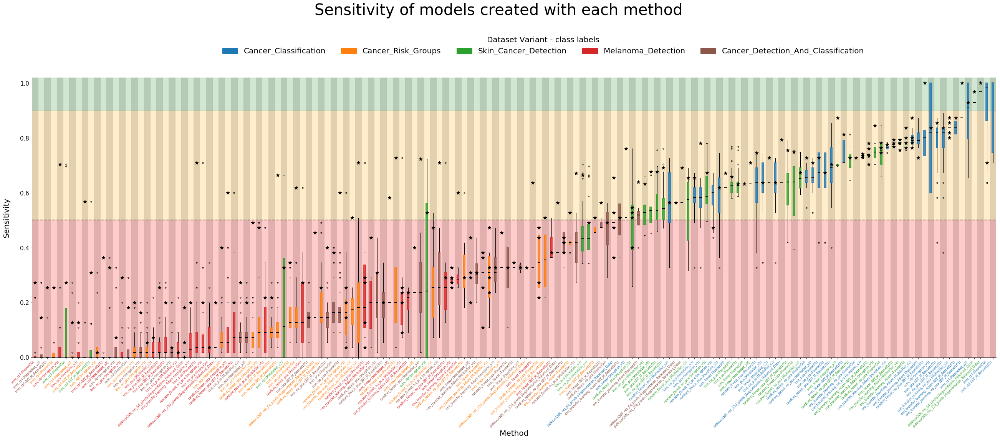

In [55]:
new_method_comparison_boxplot(                          
    title=f"Sensitivity of models created with each method\n", 
    data = summary_df_with_stats,#.iloc[0:500,:] # pd.DataFrame with the results,   
    figsize=(45,15),
    # ...
    col_with_baseline      ="baseline_acc_test",
    col_with_results       ="STATS_recall_score_test",       # df colname with values to display, eg: test_accuracy ...
    col_with_group_names   ="method_name",          # df colname with values that will be displayed as names of each box (these do not have to be unique)
    col_with_group_ID      ="method_full_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
    col_with_group_colors  ="dataset_variant",       # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
    col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
    full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
                                # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
    # ... colors
    cmap="tab10",
    cmap_colors_from=0,
    cmap_colors_to=0.5,                               
    
    # .. legend
    legend_title="Dataset Variant - class labels",
    legend__bbox_to_anchor=(0.7, 0.99),
    subplots_adjust_top = 0.8,
    legend_ncols=5,
    
    # .. baseline
    baseline_title = "",
    baseline_loc =-0.09,
    use_fixed_baselines = True,
    baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
    baseline_color_list = ["red", "orange", "forestgreen"],
    
    # ... fontsizes
    title_fontsize=40,
    legend_fontsize=20,
    xticks_fontsize=8,
    yticks_fontsize=15,
    axes_labels_fontsize=20,
    
    # ... axies labels
    xaxis_label = "Method",
    yaxis_label = "Sensitivity\n",
    paint_xticks=True,
    # ... scatterpoints for full models,
    add_full_models_markers =True, # if False, they are oging to be part of the barplots
    full_model_marker ="*",
    full_model_markersize=80,
    full_model_markercolor="black"
)

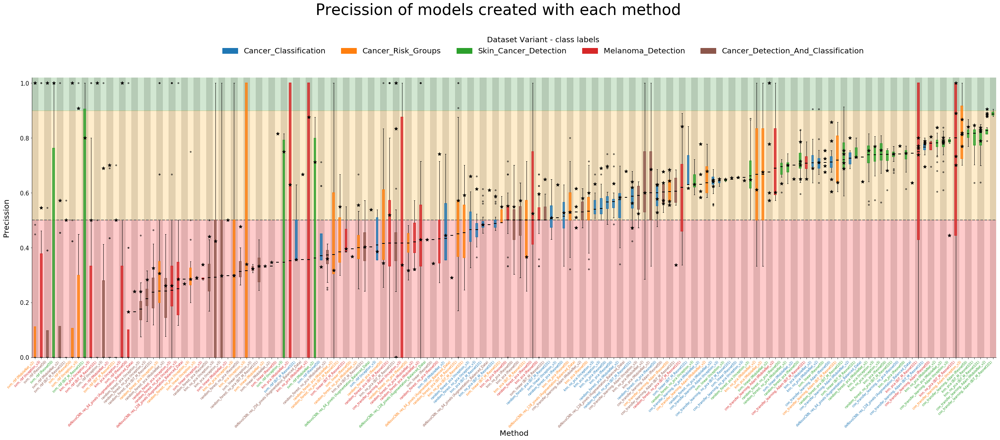

In [54]:
new_method_comparison_boxplot(                          
    title=f"Precission of models created with each method\n", 
    data = summary_df_with_stats,#.iloc[0:500,:] # pd.DataFrame with the results,   
    figsize=(45,15),
    # ...
    col_with_baseline      ="baseline_acc_test",
    col_with_results       ="STATS_precision_score_test",       # df colname with values to display, eg: test_accuracy ...
    col_with_group_names   ="method_name",          # df colname with values that will be displayed as names of each box (these do not have to be unique)
    col_with_group_ID      ="method_full_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
    col_with_group_colors  ="dataset_variant",       # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
    col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
    full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
                                # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
    # ... colors
    cmap="tab10",
    cmap_colors_from=0,
    cmap_colors_to=0.5,                               
    
    # .. legend
    legend_title="Dataset Variant - class labels",
    legend__bbox_to_anchor=(0.7, 0.99),
    subplots_adjust_top = 0.8,
    legend_ncols=5,
    
    # .. baseline
    baseline_title = "",
    baseline_loc =-0.09,
    use_fixed_baselines = True,
    baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
    baseline_color_list = ["red", "orange", "forestgreen"],
    
    # ... fontsizes
    title_fontsize=40,
    legend_fontsize=20,
    xticks_fontsize=8,
    yticks_fontsize=15,
    axes_labels_fontsize=20,
    
    # ... axies labels
    xaxis_label = "Method",
    yaxis_label = "Precission\n",
    paint_xticks=True,
    # ... scatterpoints for full models,
    add_full_models_markers =True, # if False, they are oging to be part of the barplots
    full_model_marker ="*",
    full_model_markersize=80,
    full_model_markercolor="black"
)

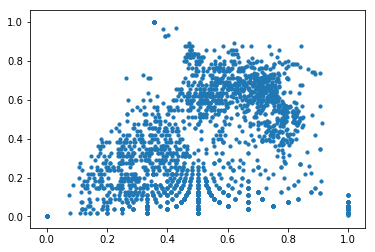

In [57]:
plt.scatter(summary_df_with_stats.STATS_precision_score_test, summary_df_with_stats.STATS_recall_score_test, s=10)